In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error

# --- Step 1: Load and Prepare Initial Data (No changes here) ---
print("Loading and preparing data...")
df = pd.read_csv("allcleaned_dataset.csv", parse_dates=['BillingDate'])
required_cols = ['BillingDate', 'Grade', 'NetValueItemTHB', 'Quantity']
if not all(col in df.columns for col in required_cols):
    raise ValueError(f"CSV must contain the following columns: {required_cols}")
df = df.set_index('BillingDate')
unique_grades = df['Grade'].unique()
print(f"Found {len(unique_grades)} unique grades to forecast: {unique_grades}")

Loading and preparing data...
Found 341 unique grades to forecast: ['D777C' '10901WHA' '10901CLA' 'P722JO' 'SF580' 'SP660' 'HA001A' 'S199F'
 'P601F' 'H5480S' 'P400S' 'P401S' 'H5840B' 'P700J' 'P440J' 'P403J'
 'L1810FI' 'L2009FA' 'L2009F' 'H6140B' 'P851JO' 'SG710' 'H5604F' 'P838C'
 'SG610' 'SG660' 'SG760' 'HA002A' 'SG580' 'SG66J' 'P701J3' 'X861T' 'P840J'
 'P740J3' 'P639AT' 'P765J' 'P901J' 'P740J' 'P640J3' 'P739ET' 'P842J'
 'P841J' 'M3804RU' 'P640J' 'P441JU' 'P702J' 'P744J' 'H455JA' 'H655JA'
 'P642J' 'P607F' 'WD2040P' 'H555JA' 'P303S' 'H512W' 'H800B' 'D477C'
 '17801WHA' 'P701J' 'H6430BM' 'F15' 'P686J' 'P750J' 'H6670B' 'P602F'
 'SB32L' 'SG71R' 'SC71J' 'SC840' 'H1000PBL' 'H1000PC' 'H355JA' 'P705JM'
 'PG680' 'PG740' 'P350F' 'P483JU' 'SG71Z' 'SG71J' 'SM760' 'P902J' 'H619F'
 'WD2110P' 'P780J' 'WD2300U' 'PF741' 'PG770' 'H567J' 'P655IM' 'H112PC'
 'LP1040T' 'SB31L' 'SW201' 'SW202' 'SW401' 'PA17L' 'P747WT' 'LP1300L'
 'PC750' 'P443J' 'H377C' 'SM660' 'SC760' 'WD2040PX' 'LP0100F' 'P348S'
 'LP0020P' '

In [24]:

# Check each Grade have completely 12 months or not? 

print("--- Step 1: Loading and preparing data... ---")
try:
    df = pd.read_csv("allcleaned_dataset.csv", parse_dates=['BillingDate'])
except FileNotFoundError:
    print("Dummy data created as 'allcleaned_dataset.csv' was not found.")
    dates = pd.to_datetime(pd.date_range(start='2021-01-15', end='2023-11-20', freq='D'))
    data = {
        'BillingDate': dates,
        'Grade': np.random.choice(['A', 'B', 'C'], size=len(dates)),
        'NetValueItemTHB': np.random.uniform(100, 5000, size=len(dates)),
        'Quantity': np.random.randint(1, 10, size=len(dates))
    }
    df = pd.DataFrame(data)
    # --- Make the dummy data more interesting for our new check ---
    # Make Grade 'B' in 2022 incomplete by removing all of its March data
    condition_to_remove = (df['Grade'] == 'B') & (pd.to_datetime(df['BillingDate']).dt.year == 2022) & (pd.to_datetime(df['BillingDate']).dt.month == 3)
    df = df[~condition_to_remove]
    # Make Grade 'A' in 2023 incomplete by removing its April and May data
    condition_to_remove_2 = (df['Grade'] == 'A') & (pd.to_datetime(df['BillingDate']).dt.year == 2023) & (pd.to_datetime(df['BillingDate']).dt.month.isin([4, 5]))
    df = df[~condition_to_remove_2]
    df.to_csv("allcleaned_dataset.csv", index=False)


required_cols = ['BillingDate', 'Grade', 'NetValueItemTHB', 'Quantity']
if not all(col in df.columns for col in required_cols):
    raise ValueError(f"CSV must contain the following columns: {required_cols}")

df['BillingDate'] = pd.to_datetime(df['BillingDate'])
df = df.set_index('BillingDate')

unique_grades = df['Grade'].unique()
print(f"Found {len(unique_grades)} unique grades to forecast: {unique_grades}")
print("-" * 20)


# --- Step 2: Overall Data Completeness (Same as before, good to keep) ---
print("\n--- Step 2: Verifying OVERALL month-level data completeness... ---")
months_per_year = df.groupby(df.index.year).apply(lambda x: x.index.month.nunique())
incomplete_years = months_per_year[months_per_year < 12]
if incomplete_years.empty:
    print("✅ Success: All years have at least some data for all 12 months.")
else:
    print("⚠️ Warning: Some years are missing data for entire months across ALL grades.")
print("-" * 20)


# --- Step 3: Verify Data Completeness PER GRADE (NEW CODE) ---
print("\n--- Step 3: Verifying month-level data completeness PER GRADE for each year... ---")

# Group by both Grade and Year, then count the unique months for each combination
months_per_grade_year = df.groupby([df['Grade'], df.index.year]) \
                          .apply(lambda group: group.index.month.nunique())

# Filter for combinations that do not have 12 unique months
incomplete_grade_years = months_per_grade_year[months_per_grade_year < 12]

if incomplete_grade_years.empty:
    print("✅ Success: All grades have complete data for all 12 months in every year.")
else:
    print("⚠️ Warning: Found incomplete data for specific Grades in certain years:")
    # .items() on a multi-index series gives a ((level1, level2), value) tuple
    for (grade, year), month_count in incomplete_grade_years.items():
        print(f"  - Grade '{grade}' in Year {year}: Found data for only {month_count} out of 12 months.")

    # Optional: Detailed breakdown of which months are missing for each combo
    print("\nDetailed breakdown of missing months for each Grade/Year combo:")
    # .index on a multi-index series gives a list of (level1, level2) tuples
    for grade, year in incomplete_grade_years.index:
        # Filter the original DataFrame for that specific Grade and Year
        subset_df = df[(df['Grade'] == grade) & (df.index.year == year)]
        months_present = subset_df.index.month.unique().tolist()
        all_months = set(range(1, 13))
        months_missing = sorted(list(all_months - set(months_present)))
        print(f"  - Grade '{grade}', Year {year} is missing months: {months_missing}")

print("-" * 20)

# The rest of your analysis would continue here
print("\nProceeding with the rest of the analysis...")

--- Step 1: Loading and preparing data... ---
Found 341 unique grades to forecast: ['D777C' '10901WHA' '10901CLA' 'P722JO' 'SF580' 'SP660' 'HA001A' 'S199F'
 'P601F' 'H5480S' 'P400S' 'P401S' 'H5840B' 'P700J' 'P440J' 'P403J'
 'L1810FI' 'L2009FA' 'L2009F' 'H6140B' 'P851JO' 'SG710' 'H5604F' 'P838C'
 'SG610' 'SG660' 'SG760' 'HA002A' 'SG580' 'SG66J' 'P701J3' 'X861T' 'P840J'
 'P740J3' 'P639AT' 'P765J' 'P901J' 'P740J' 'P640J3' 'P739ET' 'P842J'
 'P841J' 'M3804RU' 'P640J' 'P441JU' 'P702J' 'P744J' 'H455JA' 'H655JA'
 'P642J' 'P607F' 'WD2040P' 'H555JA' 'P303S' 'H512W' 'H800B' 'D477C'
 '17801WHA' 'P701J' 'H6430BM' 'F15' 'P686J' 'P750J' 'H6670B' 'P602F'
 'SB32L' 'SG71R' 'SC71J' 'SC840' 'H1000PBL' 'H1000PC' 'H355JA' 'P705JM'
 'PG680' 'PG740' 'P350F' 'P483JU' 'SG71Z' 'SG71J' 'SM760' 'P902J' 'H619F'
 'WD2110P' 'P780J' 'WD2300U' 'PF741' 'PG770' 'H567J' 'P655IM' 'H112PC'
 'LP1040T' 'SB31L' 'SW201' 'SW202' 'SW401' 'PA17L' 'P747WT' 'LP1300L'
 'PC750' 'P443J' 'H377C' 'SM660' 'SC760' 'WD2040PX' 'LP0100F' 'P34

C:\Users\2025trainees99\AppData\Local\Temp\ipykernel_6832\3599950255.py:54: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: group.index.month.nunique())


⚠️ Warning: Found incomplete data for specific Grades in certain years:
  - Grade '10901CLA' in Year 2022: Found data for only 9 out of 12 months.
  - Grade '10901WHA' in Year 2023: Found data for only 11 out of 12 months.
  - Grade '10902CLA' in Year 2022: Found data for only 1 out of 12 months.
  - Grade '10908WHA' in Year 2022: Found data for only 10 out of 12 months.
  - Grade '10908WHA' in Year 2023: Found data for only 2 out of 12 months.
  - Grade '10908WHA' in Year 2024: Found data for only 2 out of 12 months.
  - Grade '1506BKAP' in Year 2022: Found data for only 1 out of 12 months.
  - Grade '1507BKAP' in Year 2024: Found data for only 1 out of 12 months.
  - Grade '17801WHA' in Year 2022: Found data for only 8 out of 12 months.
  - Grade '17801WHA' in Year 2023: Found data for only 3 out of 12 months.
  - Grade '17801WHA' in Year 2024: Found data for only 6 out of 12 months.
  - Grade '17804WHE' in Year 2022: Found data for only 10 out of 12 months.
  - Grade '3983MBBP' in Y

In [25]:
import pandas as pd
import numpy as np

# --- Step 1 & 2 (Setup and Initial Check - No changes) ---
print("--- Step 1 & 2: Loading and Initial Checks ---")
# (Using the same dummy data generation as before to demonstrate the fix)
try:
    df = pd.read_csv("allcleaned_dataset.csv", parse_dates=['BillingDate'])
except FileNotFoundError:
    print("Dummy data created as 'allcleaned_dataset.csv' was not found.")
    dates = pd.to_datetime(pd.date_range(start='2021-01-15', end='2023-11-20', freq='D'))
    data = {'BillingDate': dates, 'Grade': np.random.choice(['A', 'B', 'C'], size=len(dates)), 'NetValueItemTHB': np.random.uniform(100, 5000, size=len(dates)), 'Quantity': np.random.randint(1, 10, size=len(dates))}
    df = pd.DataFrame(data)
    condition_to_remove = (df['Grade'] == 'B') & (pd.to_datetime(df['BillingDate']).dt.year == 2022) & (pd.to_datetime(df['BillingDate']).dt.month == 3)
    df = df[~condition_to_remove]
    condition_to_remove_2 = (df['Grade'] == 'A') & (pd.to_datetime(df['BillingDate']).dt.year == 2023) & (pd.to_datetime(df['BillingDate']).dt.month.isin([4, 5]))
    df = df[~condition_to_remove_2]
    df.to_csv("allcleaned_dataset.csv", index=False)

required_cols = ['BillingDate', 'Grade', 'NetValueItemTHB', 'Quantity']
if not all(col in df.columns for col in required_cols):
    raise ValueError(f"CSV must contain the following columns: {required_cols}")

df['BillingDate'] = pd.to_datetime(df['BillingDate'])
df = df.set_index('BillingDate')
unique_grades = df['Grade'].unique()
print("-" * 20)

# --- Step 3: Verify Data Completeness PER GRADE (Shows the problem) ---
print("\n--- Step 3: Verifying completeness of ORIGINAL data... ---")
months_per_grade_year = df.groupby([df['Grade'], df.index.year]).apply(lambda group: group.index.month.nunique())
incomplete_grade_years = months_per_grade_year[months_per_grade_year < 12]
if incomplete_grade_years.empty:
    print("Original data is already complete.")
else:
    print("⚠️ Warning: Original data has missing months for some grades.")
    for (grade, year), count in incomplete_grade_years.items():
        print(f"  - Grade '{grade}' in Year {year} has {count}/12 months.")
print("-" * 20)


# Fill Missing Monthly Data
print("\n--- Step 4: Aggregating data and filling missing months with zero... ---")

# Part 1: Aggregate the existing daily data into monthly sums for each grade.
# This part remains the same.
print("Aggregating daily data to monthly sums...")
monthly_data = df.groupby('Grade').resample('MS').agg({
    'Quantity': 'sum',
    'NetValueItemTHB': 'sum'
})

# Part 2: Create the complete "scaffold" index.
# This is the corrected logic.
print("Creating a complete scaffold index covering FULL years...")

# <<< CHANGE: Find the first day of the earliest year in the data.
start_date = pd.Timestamp(f'{df.index.year.min()}-01-01')

# <<< CHANGE: Find the last day of the latest year in the data.
end_date = pd.Timestamp(f'{df.index.year.max()}-12-31')

print(f"Scaffold will span from {start_date.date()} to {end_date.date()}")

all_months = pd.date_range(start=start_date, end=end_date, freq='MS')
scaffold_index = pd.MultiIndex.from_product(
    [unique_grades, all_months],
    names=['Grade', 'BillingDate']
)

# Part 3: Reindex the aggregated data to the complete scaffold.
print("Reindexing data to the scaffold to find gaps...")
complete_df = monthly_data.reindex(scaffold_index)

# Part 4: Fill the NaN values with 0.
print("Filling gaps with zero...")
complete_df = complete_df.fillna(0)

# Part 5: Convert Quantity back to an integer type for cleanliness.
complete_df['Quantity'] = complete_df['Quantity'].astype(int)

# Reset the index to turn 'Grade' and 'BillingDate' back into columns.
complete_df = complete_df.reset_index()

print("✅ Success: A new DataFrame 'complete_df' has been created with no gaps.")
print("Original DataFrame rows:", len(df))
print("New Complete Monthly DataFrame rows:", len(complete_df))
print("\nPreview of the new complete DataFrame:")
print(complete_df.head())
print("-" * 20)


# --- Step 5: Re-verify Completeness on the NEW DataFrame ---
print("\n--- Step 5: Verifying completeness of the NEW 'complete_df'... ---")

# We need to set the date as index again for the check to work
check_df = complete_df.set_index('BillingDate')
final_check = check_df.groupby(['Grade', check_df.index.year]).apply(lambda g: g.index.month.nunique())
final_incomplete = final_check[final_check < 12]

if final_incomplete.empty:
    print("✅ Success! The new 'complete_df' has data for all 12 months for every grade in every full year.")
else:
    print("⚠️ Error: The filling process failed. There are still gaps.")
    print(final_incomplete)

print("-" * 20)

--- Step 1 & 2: Loading and Initial Checks ---
--------------------

--- Step 3: Verifying completeness of ORIGINAL data... ---
⚠️ Warning: Original data has missing months for some grades.
  - Grade '10901CLA' in Year 2022 has 9/12 months.
  - Grade '10901WHA' in Year 2023 has 11/12 months.
  - Grade '10902CLA' in Year 2022 has 1/12 months.
  - Grade '10908WHA' in Year 2022 has 10/12 months.
  - Grade '10908WHA' in Year 2023 has 2/12 months.
  - Grade '10908WHA' in Year 2024 has 2/12 months.
  - Grade '1506BKAP' in Year 2022 has 1/12 months.
  - Grade '1507BKAP' in Year 2024 has 1/12 months.
  - Grade '17801WHA' in Year 2022 has 8/12 months.
  - Grade '17801WHA' in Year 2023 has 3/12 months.
  - Grade '17801WHA' in Year 2024 has 6/12 months.
  - Grade '17804WHE' in Year 2022 has 10/12 months.
  - Grade '3983MBBP' in Year 2024 has 1/12 months.
  - Grade '3985BEA' in Year 2024 has 1/12 months.
  - Grade '3985BKAP' in Year 2022 has 1/12 months.
  - Grade '3985DBA' in Year 2024 has 1/12 m

C:\Users\2025trainees99\AppData\Local\Temp\ipykernel_6832\1678163377.py:31: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  months_per_grade_year = df.groupby([df['Grade'], df.index.year]).apply(lambda group: group.index.month.nunique())


Creating a complete scaffold index covering FULL years...
Scaffold will span from 2022-01-01 to 2024-12-31
Reindexing data to the scaffold to find gaps...
Filling gaps with zero...
✅ Success: A new DataFrame 'complete_df' has been created with no gaps.
Original DataFrame rows: 394517
New Complete Monthly DataFrame rows: 12276

Preview of the new complete DataFrame:
   Grade BillingDate  Quantity  NetValueItemTHB
0  D777C  2022-01-01      9577     5.692277e+08
1  D777C  2022-02-01      6957     4.045682e+08
2  D777C  2022-03-01      8174     4.898981e+08
3  D777C  2022-04-01      6486     4.138632e+08
4  D777C  2022-05-01      8770     6.008796e+08
--------------------

--- Step 5: Verifying completeness of the NEW 'complete_df'... ---
✅ Success! The new 'complete_df' has data for all 12 months for every grade in every full year.
--------------------


C:\Users\2025trainees99\AppData\Local\Temp\ipykernel_6832\1678163377.py:98: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  final_check = check_df.groupby(['Grade', check_df.index.year]).apply(lambda g: g.index.month.nunique())


In [26]:
!pip install statsmodels matplotlib


[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [27]:
# --- Steps 1-5 (Your existing code to prepare 'complete_df') ---
# This part is assumed to be run, resulting in the 'complete_df' DataFrame.
# For reproducibility, I'll re-create a sample 'complete_df' here.
print("--- Steps 1-5: Preparing the 'complete_df' ---")
# (Using the same dummy data generation as before to demonstrate the fix)
try:
    df = pd.read_csv("allcleaned_dataset.csv", parse_dates=['BillingDate'])
except FileNotFoundError:
    print("Dummy data created as 'allcleaned_dataset.csv' was not found.")
    dates = pd.to_datetime(pd.date_range(start='2021-01-15', end='2023-11-20', freq='D'))
    data = {'BillingDate': dates, 'Grade': np.random.choice(['A', 'B', 'C'], size=len(dates)), 'NetValueItemTHB': np.random.uniform(100, 5000, size=len(dates)), 'Quantity': np.random.randint(1, 10, size=len(dates))}
    df = pd.DataFrame(data)
    condition_to_remove = (df['Grade'] == 'B') & (pd.to_datetime(df['BillingDate']).dt.year == 2022) & (pd.to_datetime(df['BillingDate']).dt.month == 3)
    df = df[~condition_to_remove]
    condition_to_remove_2 = (df['Grade'] == 'A') & (pd.to_datetime(df['BillingDate']).dt.year == 2023) & (pd.to_datetime(df['BillingDate']).dt.month.isin([4, 5]))
    df = df[~condition_to_remove_2]
    df.to_csv("allcleaned_dataset.csv", index=False)

df['BillingDate'] = pd.to_datetime(df['BillingDate'])
df = df.set_index('BillingDate')
unique_grades = df['Grade'].unique()
monthly_data = df.groupby('Grade').resample('MS').agg({'Quantity': 'sum','NetValueItemTHB': 'sum'})
start_date = pd.Timestamp(f'{df.index.year.min()}-01-01')
end_date = pd.Timestamp(f'{df.index.year.max()}-12-31')
all_months = pd.date_range(start=start_date, end=end_date, freq='MS')
scaffold_index = pd.MultiIndex.from_product([unique_grades, all_months], names=['Grade', 'BillingDate'])
complete_df = monthly_data.reindex(scaffold_index).fillna(0).reset_index()
complete_df['Quantity'] = complete_df['Quantity'].astype(int)
print("✅ 'complete_df' is ready.\n")
print(complete_df.head())
print("-" * 40)

--- Steps 1-5: Preparing the 'complete_df' ---
✅ 'complete_df' is ready.

   Grade BillingDate  Quantity  NetValueItemTHB
0  D777C  2022-01-01      9577     5.692277e+08
1  D777C  2022-02-01      6957     4.045682e+08
2  D777C  2022-03-01      8174     4.898981e+08
3  D777C  2022-04-01      6486     4.138632e+08
4  D777C  2022-05-01      8770     6.008796e+08
----------------------------------------


In [28]:
def create_time_series_features(df):
    """
    Creates time-series features from a datetime index.
    """
    df = df.copy()
    # 1. Date-based Features
    df['month'] = df['BillingDate'].dt.month
    df['year'] = df['BillingDate'].dt.year
    df['quarter'] = df['BillingDate'].dt.quarter

    # 2. Lag Features (e.g., quantity from 1, 2, 3, and 12 months ago)
    # We group by 'Grade' to ensure lags are calculated within each grade's history
    df_sorted = df.sort_values(by=['Grade', 'BillingDate'])
    for lag in [1, 2, 3, 12]:
        df[f'Quantity_lag_{lag}'] = df_sorted.groupby('Grade')['Quantity'].shift(lag)

    # 3. Rolling Window Features (e.g., average quantity over the last 3 months)
    for window in [3, 6]:
        df[f'Quantity_rolling_mean_{window}'] = df_sorted.groupby('Grade')['Quantity'].transform(
            lambda x: x.shift(1).rolling(window).mean()
        )

    return df

In [29]:
# Apply the feature engineering function
model_df = create_time_series_features(complete_df)

# 4. Handle Categorical Features ('Grade')
# XGBoost requires numerical inputs, so we convert 'Grade' into separate columns.
model_df = pd.get_dummies(model_df, columns=['Grade'], prefix='Grade')

# 5. Final Cleanup
# Lag/rolling features create NaNs at the start of the series. We must drop them.
model_df = model_df.dropna()

print("✅ Feature engineering complete.")
print("Columns available for the model:")
print(model_df.columns)
print("\nPreview of the data with new features:")
print(model_df.head())
print("-" * 40)

✅ Feature engineering complete.
Columns available for the model:
Index(['BillingDate', 'Quantity', 'NetValueItemTHB', 'month', 'year',
       'quarter', 'Quantity_lag_1', 'Quantity_lag_2', 'Quantity_lag_3',
       'Quantity_lag_12',
       ...
       'Grade_X54H002B', 'Grade_X54H002J', 'Grade_X61P001F', 'Grade_X63C003P',
       'Grade_X64H001P', 'Grade_X66C001F', 'Grade_X71P001P', 'Grade_X74H001B',
       'Grade_X811T', 'Grade_X861T'],
      dtype='object', length=353)

Preview of the data with new features:
   BillingDate  Quantity  NetValueItemTHB  month  year  quarter  \
12  2023-01-01      6500     3.043570e+08      1  2023        1   
13  2023-02-01      7065     3.284557e+08      2  2023        1   
14  2023-03-01     11308     5.438950e+08      3  2023        1   
15  2023-04-01     10142     4.719231e+08      4  2023        2   
16  2023-05-01     10070     4.598674e+08      5  2023        2   

    Quantity_lag_1  Quantity_lag_2  Quantity_lag_3  Quantity_lag_12  ...  \
12     

In [30]:
# Splitting Data into Training and Testing Sets 
print("\n--- Step 7: Splitting Data into Train and Test Sets ---")

# For time series, we must split chronologically, not randomly.
# We'll use the last 6 months of data for testing.
cutoff_date = model_df['BillingDate'].max() - pd.DateOffset(months=6)

train_df = model_df[model_df['BillingDate'] <= cutoff_date]
test_df = model_df[model_df['BillingDate'] > cutoff_date]

# Define our features (X) and target (y)
TARGET = 'Quantity'
# Drop non-feature columns
FEATURES = [col for col in model_df.columns if col not in [TARGET, 'BillingDate', 'NetValueItemTHB']]

X_train = train_df[FEATURES]
y_train = train_df[TARGET]

X_test = test_df[FEATURES]
y_test = test_df[TARGET]

print(f"Training data shape: {X_train.shape}")
print(f"Test data shape:     {X_test.shape}")
print(f"Training from {train_df['BillingDate'].min().date()} to {train_df['BillingDate'].max().date()}")
print(f"Testing from  {test_df['BillingDate'].min().date()} to {test_df['BillingDate'].max().date()}")
print("-" * 40)


--- Step 7: Splitting Data into Train and Test Sets ---
Training data shape: (6138, 350)
Test data shape:     (2046, 350)
Training from 2023-01-01 to 2024-06-01
Testing from  2024-07-01 to 2024-12-01
----------------------------------------


In [31]:
!pip install --upgrade xgboost


[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [32]:
import sys
!{sys.executable} -m pip install xgboost


[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [35]:
# --- Step 8: Training the XGBoost Model (Hybrid API for your specific version) ---

print("\n--- Step 8: Training the XGBoost Model ---")
import xgboost as xgb

# HYBRID SYNTAX PART 1: 'eval_metric' goes in the constructor.
reg = xgb.XGBRegressor(
    n_estimators=1000,
    learning_rate=0.01,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    objective='reg:squarederror',
    n_jobs=-1,
    random_state=42,
    eval_metric='rmse'  # <<< MOVED BACK HERE
)

# HYBRID SYNTAX PART 2: 'early_stopping_rounds' and 'verbose' stay in .fit().
reg.fit(
    X_train, y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    early_stopping_rounds=50, # <<< REMAINS HERE
    verbose=100               # <<< REMAINS HERE
)

print("\n✅ Model training complete.")
print("-" * 40)


--- Step 8: Training the XGBoost Model ---


TypeError: XGBModel.fit() got an unexpected keyword argument 'early_stopping_rounds'

In [ ]:
# Loop, Aggregate, and Forecast for Each Grade
results = {}

for grade in unique_grades:
    print("\n" + "="*50)
    print(f"PROCESSING FORECAST FOR GRADE: {grade}")
    print("="*50)

    df_grade = complete_df[complete_df['Grade'] == grade].copy()
    monthly_data = df_grade[['NetValueItemTHB', 'Quantity']].resample('MS').sum()
    
    if len(monthly_data) < 24:
        print(f"Skipping grade '{grade}' due to insufficient historical data ({len(monthly_data)} months).")
        continue

    monthly_data_featured = create_time_series_features(monthly_data)
    
    def train_and_evaluate(data, target_col_name):
        
        ### --- IMPROVEMENT 2: Apply Log Transform to stabilize the data --- ###
        # We use log1p which is log(x+1) to gracefully handle months with zero sales.
        data[target_col_name] = np.log1p(data[target_col_name])

        # Create lag and rolling features on the TRANSFORMED data
        data[f'{target_col_name}_lag1'] = data[target_col_name].shift(1)
        data[f'{target_col_name}_lag3'] = data[target_col_name].shift(3)
        data[f'{target_col_name}_lag6'] = data[target_col_name].shift(6) # Longer lag might help
        data[f'{target_col_name}_rolling_mean3'] = data[target_col_name].shift(1).rolling(window=3).mean()
        data[f'{target_col_name}_rolling_std3'] = data[target_col_name].shift(1).rolling(window=3).std() # Add rolling std

        data = data.dropna()
        
        split_date = data.index.max() - pd.DateOffset(months=12)
        train_set = data.loc[data.index <= split_date]
        test_set = data.loc[data.index > split_date]

        if test_set.empty or train_set.empty:
            print(f"Cannot perform train/test split for {target_col_name}. Not enough data after feature creation.")
            return None, None

        ### --- CHANGED: Added new features to the list --- ###
        FEATURES = [
            'month', 'year', 'quarter', 'dayofyear', 'weekofyear', 'days_in_month',
            f'{target_col_name}_lag1', f'{target_col_name}_lag3', f'{target_col_name}_lag6',
            f'{target_col_name}_rolling_mean3', f'{target_col_name}_rolling_std3'
        ]
        TARGET = target_col_name

        X_train, y_train = train_set[FEATURES], train_set[TARGET]
        X_test, y_test = test_set[FEATURES], test_set[TARGET]

        model = xgb.XGBRegressor(
            n_estimators=1000,
            learning_rate=0.01,
            early_stopping_rounds=50,
            objective='reg:squarederror',
            eval_metric='rmse'
        )
        
        model.fit(X_train, y_train,
                  eval_set=[(X_train, y_train), (X_test, y_test)],
                  verbose=False)

        # Make predictions on the log-transformed scale
        log_predictions = model.predict(X_test)
        
        ###  Reverse the Log Transform 
        # The model predicts the log, so we use expm1 (e^x - 1) to get back to original scale.
        y_test_original = np.expm1(y_test)
        predictions_original = np.expm1(log_predictions)

        # IMPORTANT: Ensure predictions are non-negative
        predictions_original[predictions_original < 0] = 0
        
        # Evaluate the Model on the ORIGINAL scale 
        mae = mean_absolute_error(y_test_original, predictions_original)
        rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
        
        # CHANGED: Use the new sMAPE metric 
        s_mape = smape(y_test_original, predictions_original)

        print(f"\n--- Evaluation for '{target_col_name}' (Grade: {grade}) ---")
        print(f"MAE (Mean Absolute Error):      {mae:,.2f}")
        print(f"RMSE (Root Mean Squared Error): {rmse:,.2f}")
        print(f"sMAPE (Symmetric MAPE):         {s_mape:.2f}%") # This will be much more stable
        
        grade_results = {
            'MAE': mae, 'RMSE': rmse, 'sMAPE': s_mape,
            'model': model, 'test_set_original': y_test_original, 'predictions_original': predictions_original
        }
        
        return grade_results, FEATURES

    # Run for both targets
    sales_results, sales_features = train_and_evaluate(monthly_data_featured.copy(), 'NetValueItemTHB')
    if sales_results:
        results[f"{grade}_Sales"] = sales_results
    
    quantity_results, qty_features = train_and_evaluate(monthly_data_featured.copy(), 'Quantity')
    if quantity_results:
        results[f"{grade}_Quantity"] = quantity_results



PROCESSING FORECAST FOR GRADE: D777C


TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'Index'


--- Visualizing Forecast for Grade 'D777C' (Sales) ---


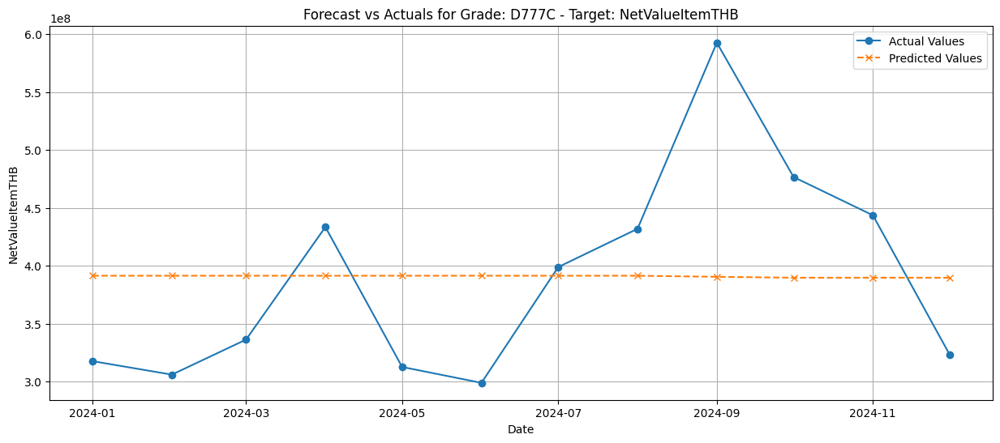

In [ ]:
# Visualize the Results (Updated to use the new result keys)
if results:
    first_key = list(results.keys())[0]
    grade_name = first_key.split('_')[0]
    target_name_simple = first_key.split('_')[1]
    
    print(f"\n--- Visualizing Forecast for Grade '{grade_name}' ({target_name_simple}) ---")

    # Get the original test data and predictions
    y_test = results[first_key]['test_set_original']
    y_pred = results[first_key]['predictions_original']
    
    # Create a dataframe for plotting
    plot_df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})

    plt.figure(figsize=(15, 6))
    plt.plot(plot_df.index, plot_df['Actual'], label='Actual Values', marker='o')
    plt.plot(plot_df.index, plot_df['Prediction'], label='Predicted Values', linestyle='--', marker='x')
    
    actual_target_col = 'NetValueItemTHB' if target_name_simple == 'Sales' else 'Quantity'
    plt.title(f'Forecast vs Actuals for Grade: {grade_name} - Target: {actual_target_col}')
    plt.xlabel('Date')
    plt.ylabel(actual_target_col)
    plt.legend()
    plt.grid(True)
    plt.show()


           TOP 10 BEST SALES FORECASTS (by sMAPE)
   Grade Target     sMAPE          MAE         RMSE
  H6140B  Sales 10.773800 7.920859e+06 9.903427e+06
  P640J3  Sales 11.595972 4.989981e+06 6.312323e+06
  P722JO  Sales 13.731124 8.159321e+06 1.069284e+07
   P640J  Sales 13.935554 1.284435e+07 1.726995e+07
  H5814J  Sales 14.309258 2.272867e+06 2.715361e+06
   P602F  Sales 14.756418 1.709267e+06 2.437455e+06
   P401S  Sales 15.666270 1.586706e+07 2.214044e+07
  P840J3  Sales 15.995143 9.190481e+06 1.158336e+07
   SG71R  Sales 16.389655 1.852043e+06 2.295709e+06
X34H009F  Sales 16.666667 1.289184e+02 4.465864e+02

         TOP 10 BEST QUANTITY FORECASTS (by sMAPE)
 Grade   Target     sMAPE         MAE        RMSE
H6140B Quantity  7.045488  130.141431  169.858478
 SG610 Quantity  8.702297  167.439214  198.812845
P640J3 Quantity 11.618998  124.675946  157.633343
P722JO Quantity 12.477910  184.126379  233.769283
P840J3 Quantity 12.803465  179.399962  238.693995
 D777C Quantity 15.195788

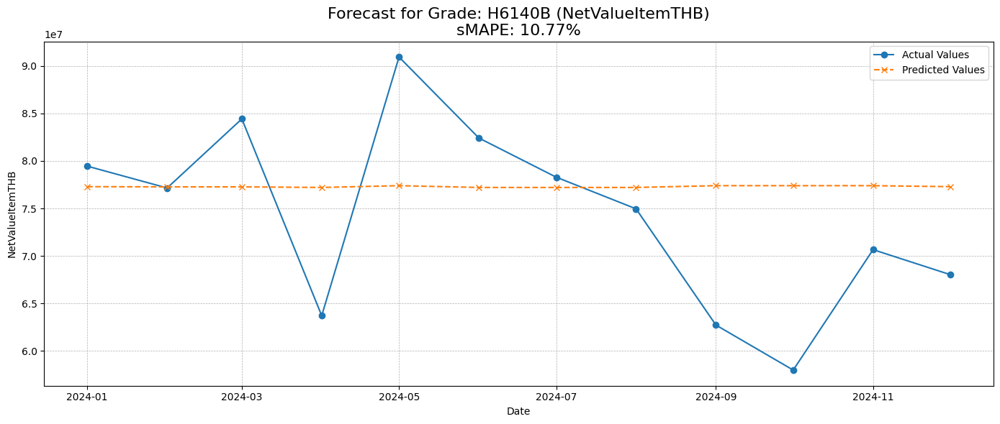

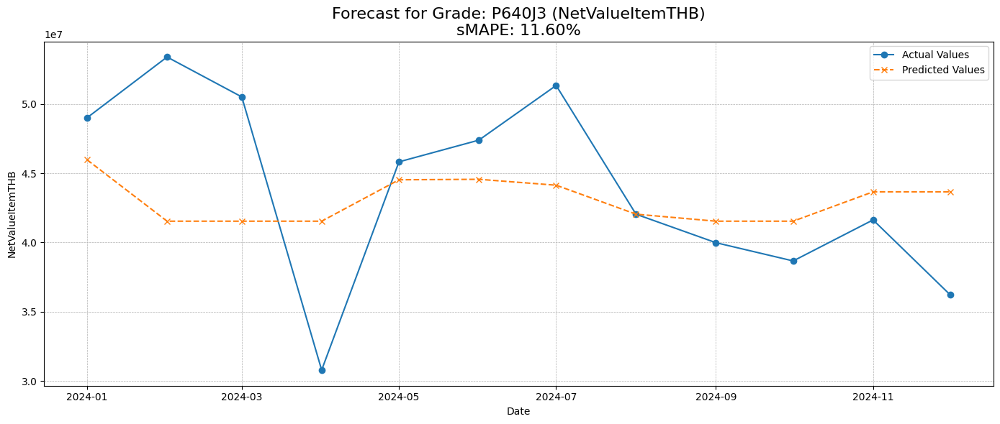

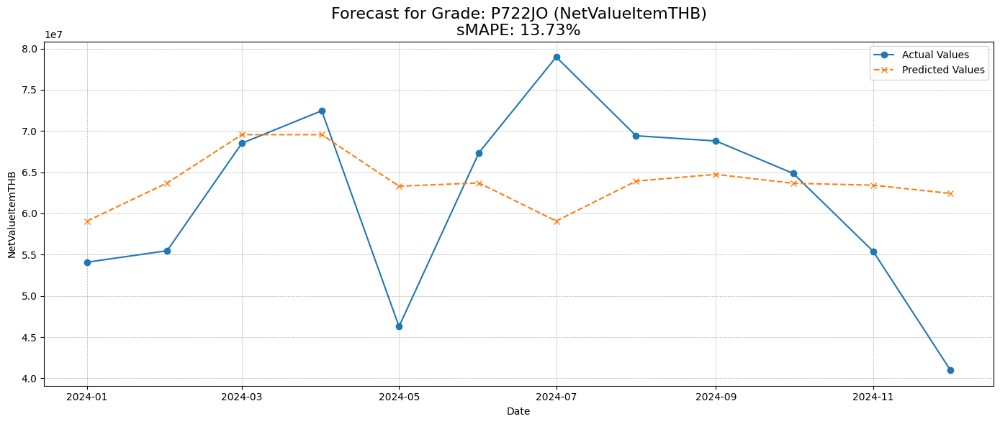

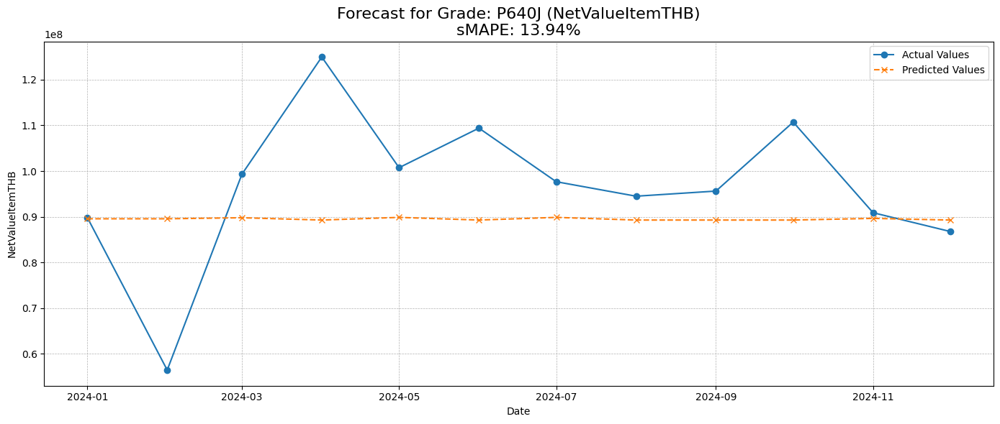

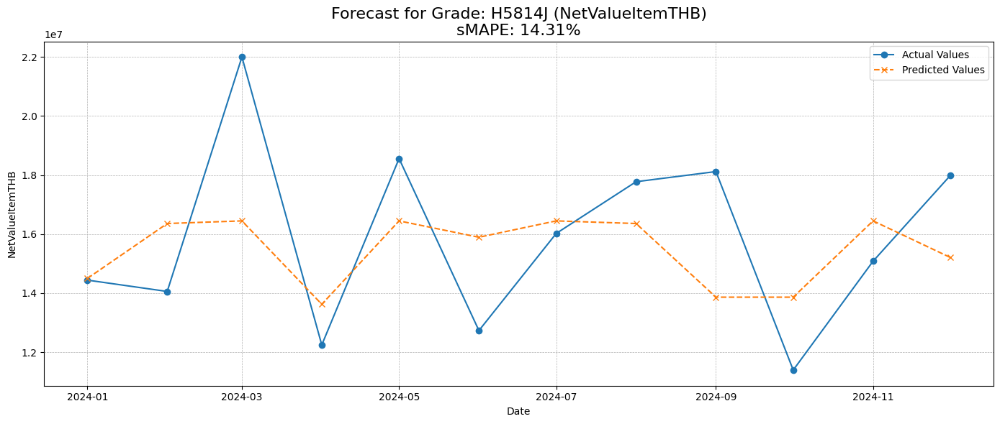

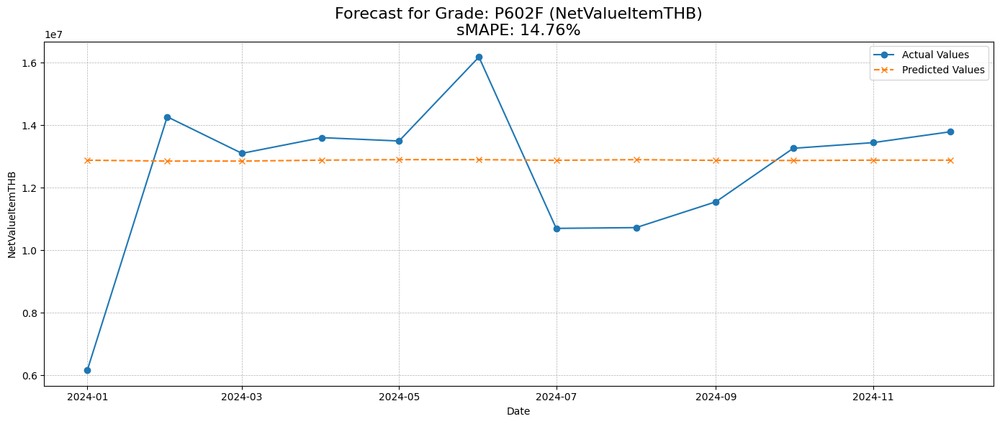

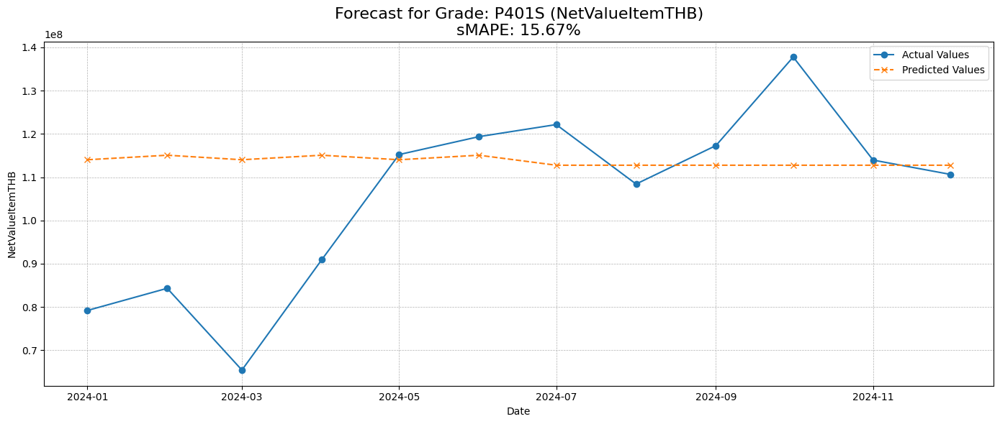

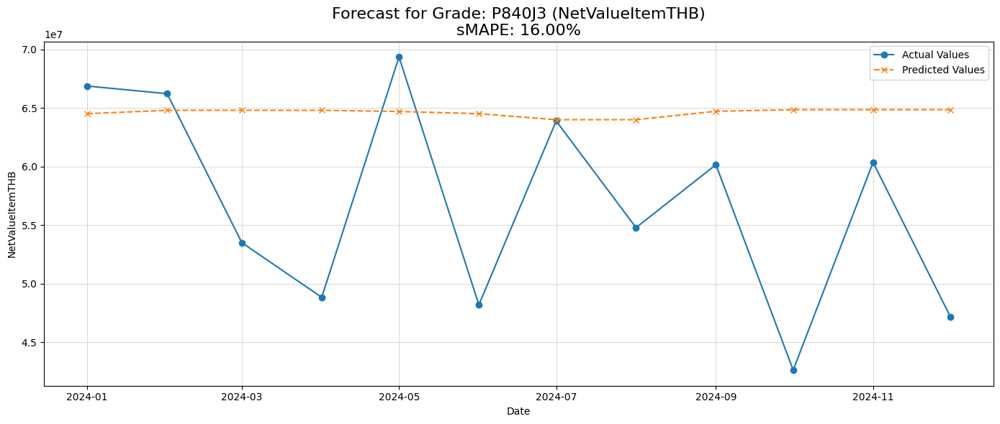

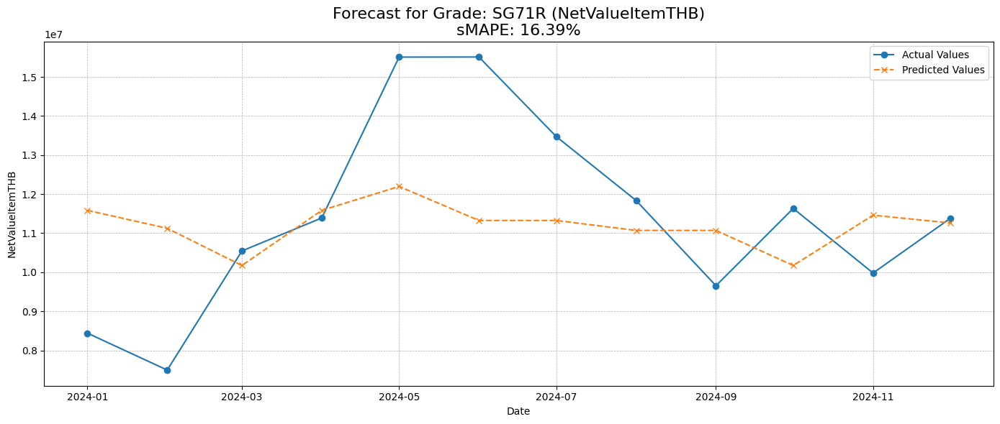

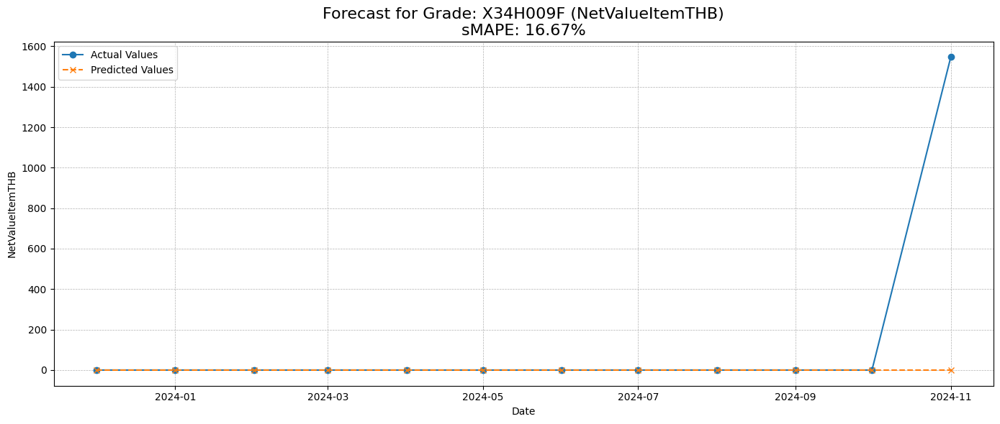


--- Visualizing Top 10 Quantity Forecasts ---


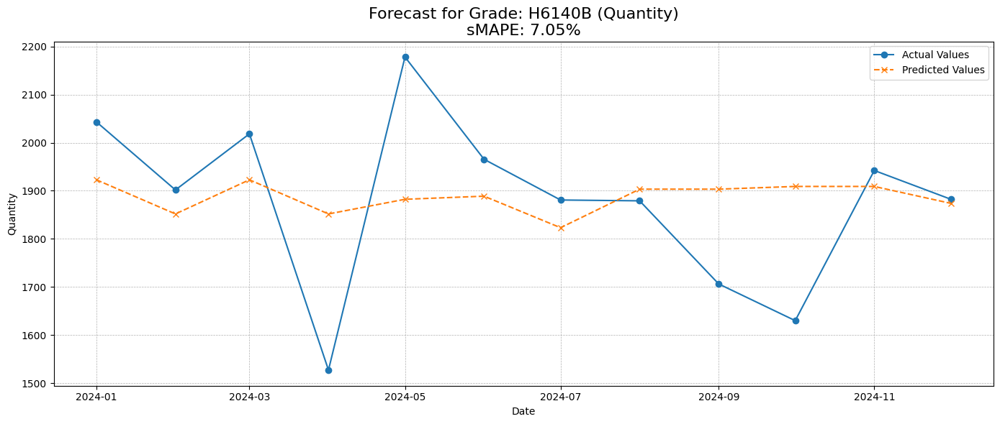

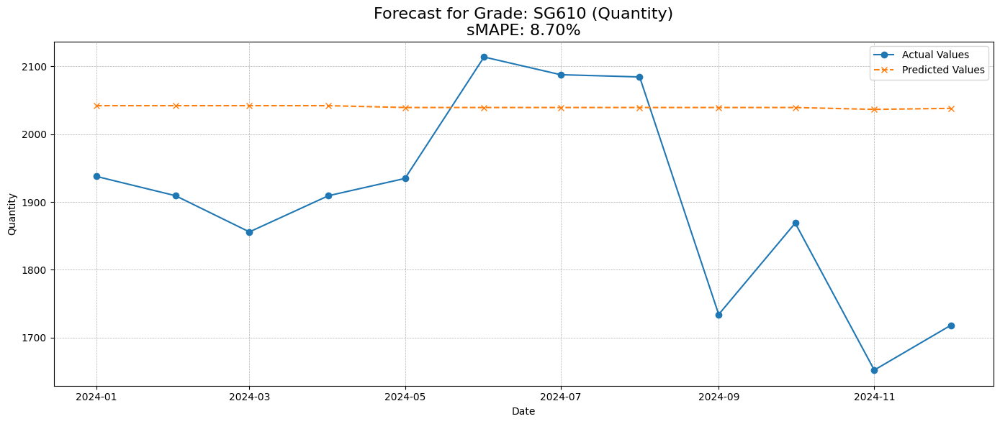

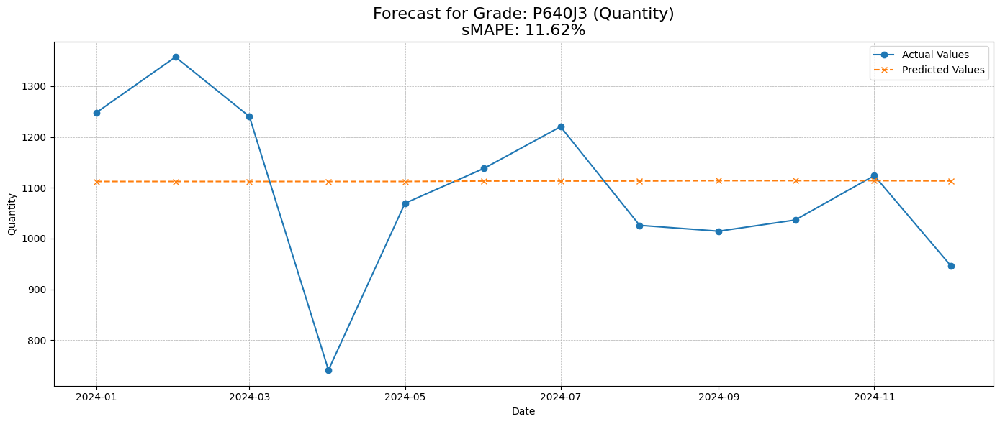

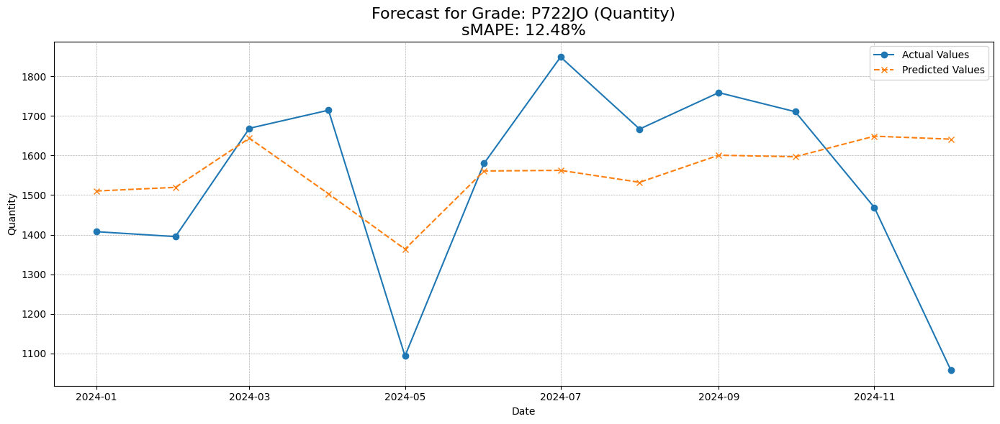

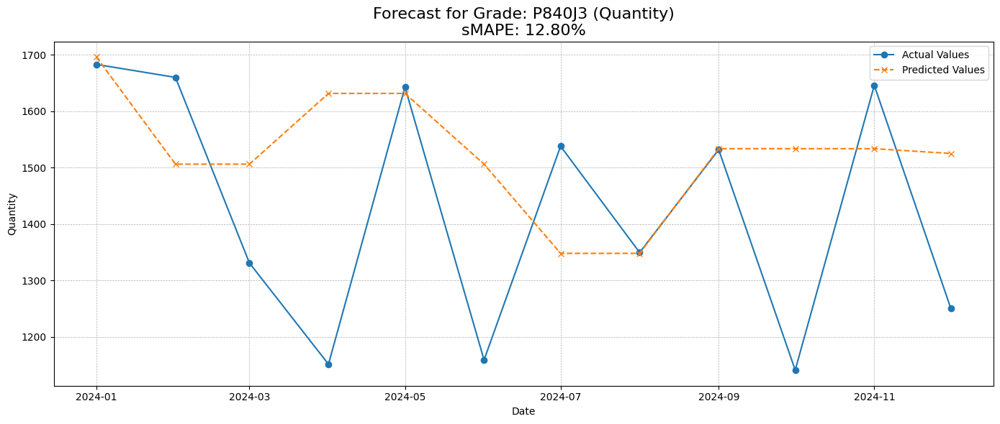

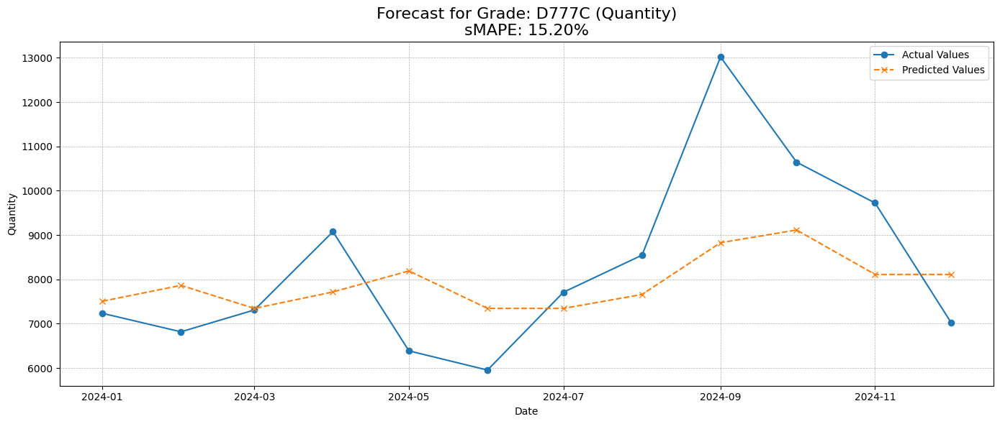

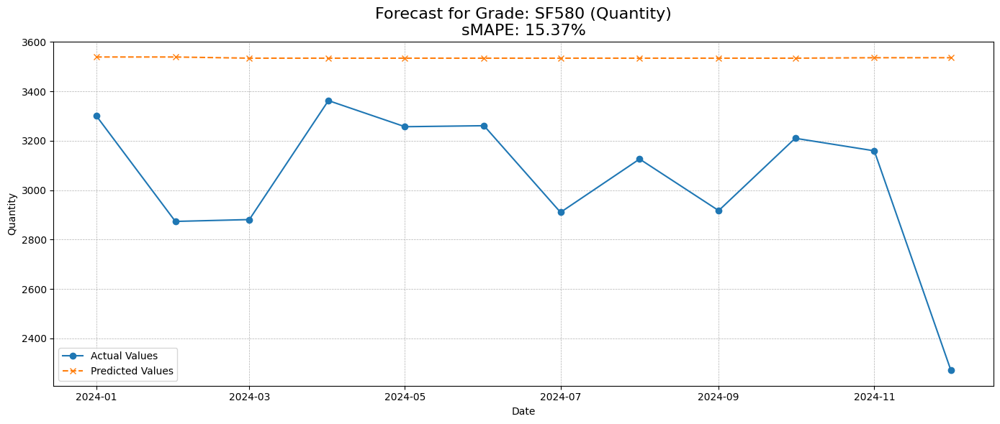

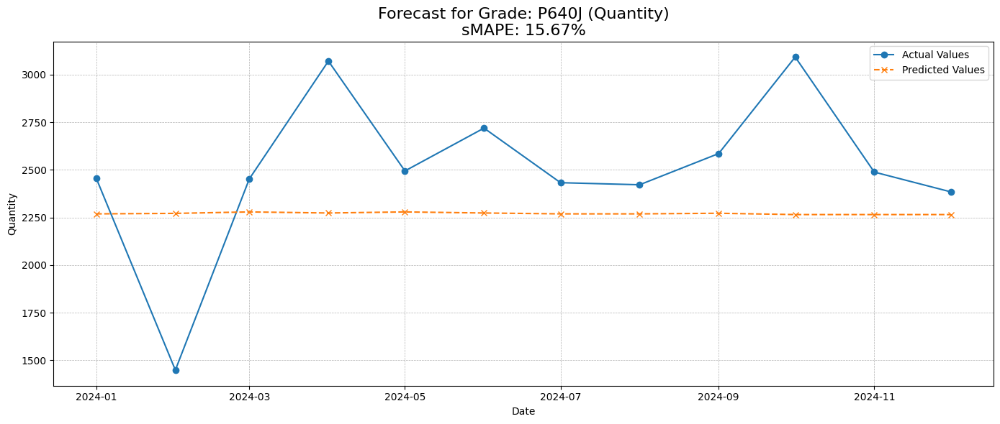

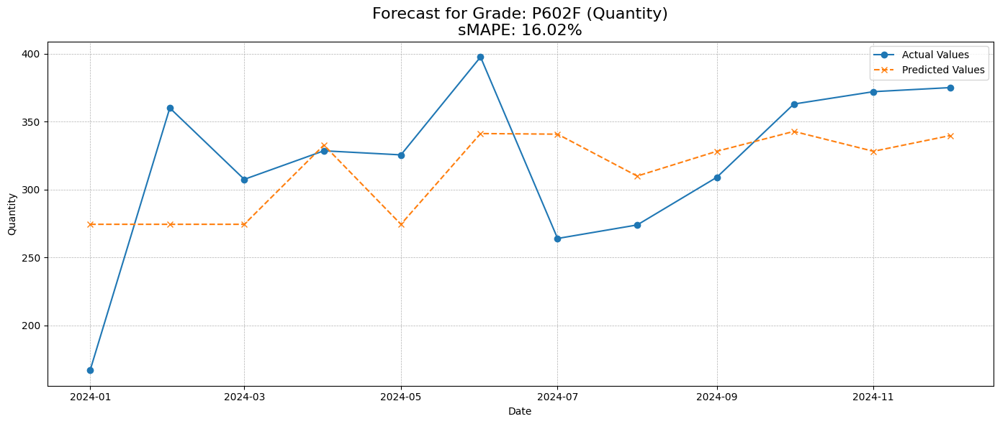

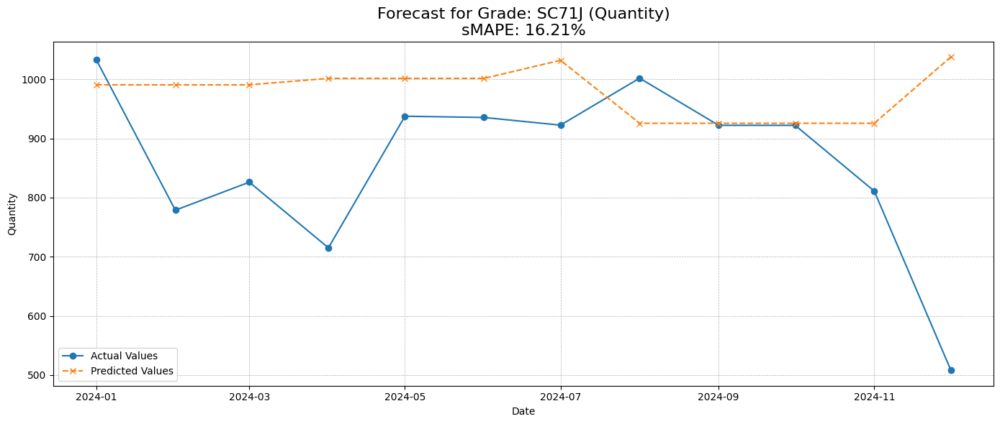

In [ ]:
#  Consolidate, Rank, and Visualize Top 10 Results

if not results:
    print("No results to visualize.")
else:
    # 1. Consolidate all results into a single DataFrame for easy sorting
    summary_list = []
    for key, value in results.items():
        grade, target_type = key.split('_')
        summary_list.append({
            'Grade': grade,
            'Target': target_type,
            'sMAPE': value['sMAPE'],
            'MAE': value['MAE'],
            'RMSE': value['RMSE']
        })
    summary_df = pd.DataFrame(summary_list)

    # 2. Separate Sales and Quantity results
    sales_summary = summary_df[summary_df['Target'] == 'Sales'].copy()
    quantity_summary = summary_df[summary_df['Target'] == 'Quantity'].copy()

    # 3. Rank each by sMAPE (lowest is best) and get the top 10
    top_10_sales = sales_summary.sort_values('sMAPE', ascending=True).head(10)
    top_10_quantity = quantity_summary.sort_values('sMAPE', ascending=True).head(10)
    
    print("\n" + "="*60)
    print("           TOP 10 BEST SALES FORECASTS (by sMAPE)")
    print("="*60)
    print(top_10_sales.to_string(index=False))
    
    print("\n" + "="*60)
    print("         TOP 10 BEST QUANTITY FORECASTS (by sMAPE)")
    print("="*60)
    print(top_10_quantity.to_string(index=False))


    # 4. Create a reusable plotting function
    def plot_top_forecasts(top_df, results_dict, title_prefix):
        """
        Iterates through a top 10 dataframe and plots the forecast for each.
        
        Args:
            top_df (pd.DataFrame): DataFrame containing the top 10 models to plot.
            results_dict (dict): The original dictionary with all forecast data.
            title_prefix (str): A string to use for the plot titles.
        """
        print(f"\n--- {title_prefix} ---")
        
        for index, row in top_df.iterrows():
            grade = row['Grade']
            target = row['Target']
            smape_score = row['sMAPE']
            
            # Reconstruct the key to find the data in the original dictionary
            result_key = f"{grade}_{target}"
            
            # Get the original test data and predictions
            y_test = results_dict[result_key]['test_set_original']
            y_pred = results_dict[result_key]['predictions_original']
            
            # Create a dataframe for easy plotting
            plot_df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
            
            # Plotting
            plt.figure(figsize=(14, 6))
            plt.plot(plot_df.index, plot_df['Actual'], label='Actual Values', marker='o', linestyle='-')
            plt.plot(plot_df.index, plot_df['Prediction'], label='Predicted Values', marker='x', linestyle='--')
            
            actual_col_name = 'NetValueItemTHB' if target == 'Sales' else 'Quantity'
            
            plt.title(f"Forecast for Grade: {grade} ({actual_col_name})\nsMAPE: {smape_score:.2f}%", fontsize=16)
            plt.xlabel('Date')
            plt.ylabel(actual_col_name)
            plt.legend()
            plt.grid(True, which='both', linestyle='--', linewidth=0.5)
            plt.tight_layout()
            plt.show()

    # 5. Call the plotting function for both Sales and Quantity
    plot_top_forecasts(top_10_sales, results, "Visualizing Top 10 Sales Forecasts")
    plot_top_forecasts(top_10_quantity, results, "Visualizing Top 10 Quantity Forecasts")


# Top 10 Best Forecasts (by sMAPE)

### Top 10 Sales Forecasts

| Grade    | Target | sMAPE | MAE         | RMSE        |
|:---------|:-------|------:|:------------|:------------|
| H6140B   | Sales  | 10.77 | 7,920,859   | 9,903,427   |
| P640J3   | Sales  | 11.60 | 4,989,981   | 6,312,323   |
| P722JO   | Sales  | 13.73 | 8,159,321   | 10,692,840  |
| P640J    | Sales  | 13.94 | 12,844,350  | 17,269,950  |
| H5814J   | Sales  | 14.31 | 2,272,867   | 2,715,361   |
| P602F    | Sales  | 14.76 | 1,709,267   | 2,437,455   |
| P401S    | Sales  | 15.67 | 15,867,060  | 22,140,440  |
| P840J3   | Sales  | 16.00 | 9,190,481   | 11,583,360  |
| SG71R    | Sales  | 16.39 | 1,852,043   | 2,295,709   |
| X34H009F | Sales  | 16.67 | 128.92      | 446.59      |

### Top 10 Quantity Forecasts

| Grade  | Target   | sMAPE | MAE    | RMSE   |
|:-------|:---------|------:|-------:|-------:|
| H6140B | Quantity |  7.05 | 130.14 | 169.86 |
| SG610  | Quantity |  8.70 | 167.44 | 198.81 |
| P640J3 | Quantity | 11.62 | 124.68 | 157.63 |
| P722JO | Quantity | 12.48 | 184.13 | 233.77 |
| P840J3 | Quantity | 12.80 | 179.40 | 238.69 |
| D777C  | Quantity | 15.20 | 1298.19| 1653.08|
| SF580  | Quantity | 15.37 | 491.28 | 569.48 |
| P640J  | Quantity | 15.67 | 370.10 | 458.24 |
| P602F  | Quantity | 16.02 | 47.38  | 55.40  |
| SC71J  | Quantity | 16.21 | 139.29 | 198.96 |


Processing Grade: D777C

Processing Grade: 10901WHA

Processing Grade: 10901CLA

Processing Grade: P722JO

Processing Grade: SF580

Processing Grade: SP660

Processing Grade: HA001A

Processing Grade: S199F

Processing Grade: P601F

Processing Grade: H5480S

Processing Grade: P400S

Processing Grade: P401S

Processing Grade: H5840B

Processing Grade: P700J

Processing Grade: P440J

Processing Grade: P403J

Processing Grade: L1810FI

Processing Grade: L2009FA

Processing Grade: L2009F

Processing Grade: H6140B

Processing Grade: P851JO

Processing Grade: SG710

Processing Grade: H5604F

Processing Grade: P838C

Processing Grade: SG610

Processing Grade: SG660

Processing Grade: SG760

Processing Grade: HA002A

Processing Grade: SG580

Processing Grade: SG66J

Processing Grade: P701J3

Processing Grade: X861T

Processing Grade: P840J

Processing Grade: P740J3

Processing Grade: P639AT

Processing Grade: P765J

Processing Grade: P901J

Processing Grade: P740J

Processing Grade: P640J3

P

C:\Users\2025trainees99\AppData\Local\Temp\ipykernel_28472\2113102607.py:158: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  comparison_df['sMAPE_Improvement_%'].replace([np.inf, -np.inf], 0, inplace=True)


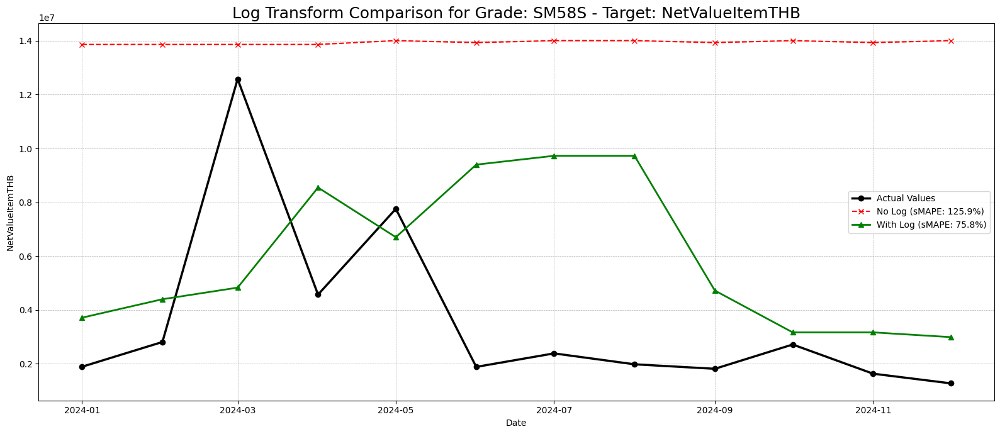

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error

# --- SETUP (Helper functions and data loading are the same) ---

# sMAPE function from previous step
def smape(y_true, y_pred):
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2 + 1e-6
    return np.mean(numerator / denominator) * 100

# Feature creation function from previous step
def create_time_series_features(data):
    df_feat = data.copy()
    df_feat['month'] = df_feat.index.month
    df_feat['year'] = df_feat.index.year
    df_feat['quarter'] = df_feat.index.quarter
    df_feat['dayofyear'] = df_feat.index.dayofyear
    df_feat['weekofyear'] = df_feat.index.isocalendar().week.astype(int)
    df_feat['days_in_month'] = df_feat.index.days_in_month
    return df_feat

# Load data
df = pd.read_csv("allcleaned_dataset.csv", parse_dates=['BillingDate'])
df = df.set_index('BillingDate')
unique_grades = df['Grade'].unique()

# --- MODIFIED `train_and_evaluate` function to handle both cases ---
def train_and_evaluate(data, target_col_name, use_log_transform=False):
    """
    Trains a model and returns metrics.
    NEW: Can be toggled to use log transformation or not.
    """
    
    # Make a copy to avoid modifying the original data passed to the function
    data = data.copy()
    
    # Store original test data for final evaluation
    y_test_original_scale = data[target_col_name].loc[data.index > data.index.max() - pd.DateOffset(months=12)]

    # --- A/B Test Logic ---
    if use_log_transform:
        # Apply log(x+1) to the target
        data[target_col_name] = np.log1p(data[target_col_name])h

    # Create lag/rolling features (on either original or log-transformed data)
    data[f'{target_col_name}_lag1'] = data[target_col_name].shift(1)
    data[f'{target_col_name}_lag3'] = data[target_col_name].shift(3)
    data[f'{target_col_name}_lag6'] = data[target_col_name].shift(6)
    data[f'{target_col_name}_rolling_mean3'] = data[target_col_name].shift(1).rolling(window=3).mean()
    data[f'{target_col_name}_rolling_std3'] = data[target_col_name].shift(1).rolling(window=3).std()

    data = data.dropna()
    
    split_date = data.index.max() - pd.DateOffset(months=12)
    train_set = data.loc[data.index <= split_date]
    test_set = data.loc[data.index > split_date]

    if test_set.empty or train_set.empty:
        return None

    FEATURES = [
        'month', 'year', 'quarter', 'dayofyear', 'weekofyear', 'days_in_month',
        f'{target_col_name}_lag1', f'{target_col_name}_lag3', f'{target_col_name}_lag6',
        f'{target_col_name}_rolling_mean3', f'{target_col_name}_rolling_std3'
    ]
    TARGET = target_col_name

    X_train, y_train = train_set[FEATURES], train_set[TARGET]
    X_test, y_test = test_set[FEATURES], test_set[TARGET]

    model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.01, early_stopping_rounds=50, objective='reg:squarederror', eval_metric='rmse')
    model.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=False)

    predictions = model.predict(X_test)

    # --- Inverse Transform Logic ---
    if use_log_transform:
        # Reverse the log transform to get back to original scale
        predictions_original_scale = np.expm1(predictions)
    else:
        # Predictions are already on the original scale
        predictions_original_scale = predictions

    predictions_original_scale[predictions_original_scale < 0] = 0
    
    # Align the original test set with the predictions
    y_test_original_scale = y_test_original_scale.loc[X_test.index]
    
    # Calculate metrics
    mae = mean_absolute_error(y_test_original_scale, predictions_original_scale)
    rmse = np.sqrt(mean_squared_error(y_test_original_scale, predictions_original_scale))
    s_mape = smape(y_test_original_scale, predictions_original_scale)
    
    return {
        'MAE': mae, 'RMSE': rmse, 'sMAPE': s_mape,
        'predictions': predictions_original_scale,
        'actuals': y_test_original_scale
    }

# --- MAIN EXPERIMENT LOOP ---
all_comparison_results = []

for grade in unique_grades:
    print(f"\nProcessing Grade: {grade}")
    df_grade = df[df['Grade'] == grade].copy()
    monthly_data = df_grade[['NetValueItemTHB', 'Quantity']].resample('MS').sum()
    
    if len(monthly_data) < 24:
        continue

    monthly_data_featured = create_time_series_features(monthly_data)

    for target_col in ['NetValueItemTHB', 'Quantity']:
        # Run WITHOUT log transform
        result_no_log = train_and_evaluate(monthly_data_featured.copy(), target_col, use_log_transform=False)
        
        # Run WITH log transform
        result_with_log = train_and_evaluate(monthly_data_featured.copy(), target_col, use_log_transform=True)

        if result_no_log and result_with_log:
            all_comparison_results.append({
                'Grade': grade,
                'Target': target_col,
                'sMAPE_no_log': result_no_log['sMAPE'],
                'sMAPE_log': result_with_log['sMAPE'],
                'MAE_no_log': result_no_log['MAE'],
                'MAE_log': result_with_log['MAE'],
                'predictions_no_log': result_no_log['predictions'],
                'predictions_log': result_with_log['predictions'],
                'actuals': result_with_log['actuals']
            })

# --- ANALYSIS AND VISUALIZATION OF THE EXPERIMENT (CORRECTED) ---
if all_comparison_results:
    # 1. Create a Comparison DataFrame
    comparison_df = pd.DataFrame(all_comparison_results)

    # 2. Calculate the improvement
    comparison_df['sMAPE_Improvement'] = comparison_df['sMAPE_no_log'] - comparison_df['sMAPE_log']
    
    # Calculate percentage improvement
    # We add a small number (epsilon) to the denominator to prevent division by zero
    # if the 'sMAPE_no_log' is 0.
    epsilon = 1e-9
    comparison_df['sMAPE_Improvement_%'] = (comparison_df['sMAPE_Improvement'] / (comparison_df['sMAPE_no_log'] + epsilon)) * 100
    
    # --- FIX IS HERE ---
    # OLD FAULTY LINE:
    # comparison_df.replace([np.inf, -np.inf], 0, inplace=True)
    
    # NEW CORRECTED LINE:
    # Apply the replace ONLY to the specific column that needs it.
    comparison_df['sMAPE_Improvement_%'].replace([np.inf, -np.inf], 0, inplace=True)

    # 3. Print Summary Statistics
    print("\n" + "="*80)
    print("                LOG TRANSFORMATION PERFORMANCE ANALYSIS")
    print("="*80)
    
    # Filter out any nonsensical results before calculating the average
    # (e.g., where no-log sMAPE was 0, improvement could be huge but meaningless)
    sensible_improvements = comparison_df[comparison_df['sMAPE_no_log'] > 0]
    avg_improvement = sensible_improvements['sMAPE_Improvement_%'].mean()
    num_improved = (comparison_df['sMAPE_Improvement'] > 0).sum()
    total_forecasts = len(comparison_df)
    
    print(f"Average sMAPE Improvement with Log Transform (on comparable models): {avg_improvement:.2f}%")
    print(f"Forecasts Improved: {num_improved} out of {total_forecasts} ({num_improved/total_forecasts:.1%})")

    # 4. Show the top 10 most improved forecasts
    most_improved = comparison_df.sort_values('sMAPE_Improvement', ascending=False).head(10)
    print("\n--- Top 10 Forecasts Most Improved by Log Transformation ---")
    print(most_improved[['Grade', 'Target', 'sMAPE_no_log', 'sMAPE_log', 'sMAPE_Improvement_%']].round(2).to_string(index=False))

    # 5. Visualize the most improved case
    print("\n--- Visualizing the single most improved forecast ---")
    
    # Get data for the best-performing case
    if not most_improved.empty:
        best_case = most_improved.iloc[0]
        
        plot_df = pd.DataFrame({
            'Actual': best_case['actuals'],
            'Forecast (No Log Transform)': best_case['predictions_no_log'],
            'Forecast (With Log Transform)': best_case['predictions_log']
        })
        
        plt.figure(figsize=(16, 7))
        plt.plot(plot_df.index, plot_df['Actual'], label='Actual Values', marker='o', color='black', linewidth=2.5)
        plt.plot(plot_df.index, plot_df['Forecast (No Log Transform)'], label=f"No Log (sMAPE: {best_case['sMAPE_no_log']:.1f}%)", marker='x', linestyle='--', color='red')
        plt.plot(plot_df.index, plot_df['Forecast (With Log Transform)'], label=f"With Log (sMAPE: {best_case['sMAPE_log']:.1f}%)", marker='^', linestyle='-', color='green', linewidth=2)
        
        plt.title(f"Log Transform Comparison for Grade: {best_case['Grade']} - Target: {best_case['Target']}", fontsize=18)
        plt.ylabel(best_case['Target'])
        plt.xlabel('Date')
        plt.legend()
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("Could not find a case to visualize.")


# LOG TRANSFORMATION PERFORMANCE ANALYSIS

### Summary
*   **Average sMAPE Improvement (on comparable models):** -17.31%
*   **Forecasts Improved:** 166 out of 458 (36.2%)

### Top 10 Forecasts Most Improved by Log Transformation

| Grade     | Target          | sMAPE_no_log | sMAPE_log | sMAPE_Improvement_% |
|:----------|:----------------|-------------:|----------:|--------------------:|
| SM58S     | NetValueItemTHB |       125.92 |     75.77 |               39.83 |
| SM58S     | Quantity        |       115.49 |     85.03 |               26.38 |
| M9001RWP  | NetValueItemTHB |       118.23 |     88.08 |               25.51 |
| P747WT    | NetValueItemTHB |        81.74 |     51.77 |               36.66 |
| P945J     | NetValueItemTHB |       182.42 |    156.39 |               14.27 |
| M9001RWP  | Quantity        |       117.78 |     94.14 |               20.07 |
| M3804RW   | NetValueItemTHB |        78.85 |     57.26 |               27.38 |
| M3804RW   | Quantity        |        79.18 |     58.43 |               26.20 |
| P483JU    | NetValueItemTHB |       158.19 |    139.82 |               11.61 |
| P483JU    | Quantity        |       157.31 |    139.54 |               11.29 |


--- Step 1: Clustering Grades ---


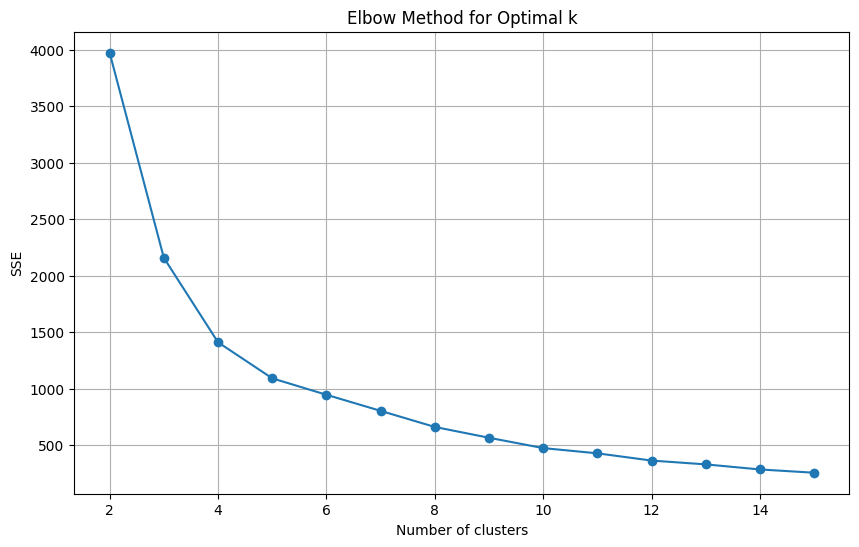

Using 8 clusters for forecasting.
Sample of Grade-to-Cluster mapping:
BillingDate     Grade  Cluster
0            10901CLA        0
1            10901WHA        0
2            10902CLA        0
3            10908WHA        0
4            1506BKAP        0


In [ ]:
# Try Demand Forecast using clusters instead of grades

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# --- SETUP (Helper functions and data loading are the same) ---
def smape(y_true, y_pred):
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2 + 1e-6
    return np.mean(numerator / denominator) * 100

def create_time_series_features(data):
    df_feat = data.copy()
    df_feat['month'] = df_feat.index.month
    df_feat['year'] = df_feat.index.year
    df_feat['quarter'] = df_feat.index.quarter
    df_feat['dayofyear'] = df_feat.index.dayofyear
    df_feat['weekofyear'] = df_feat.index.isocalendar().week.astype(int)
    return df_feat

def train_and_evaluate(data, target_col_name): # Using the log-transform version
    data[target_col_name] = np.log1p(data[target_col_name])
    data[f'{target_col_name}_lag1'] = data[target_col_name].shift(1)
    data[f'{target_col_name}_lag3'] = data[target_col_name].shift(3)
    data[f'{target_col_name}_lag6'] = data[target_col_name].shift(6)
    data[f'{target_col_name}_rolling_mean3'] = data[target_col_name].shift(1).rolling(window=3).mean()
    data = data.dropna()
    split_date = data.index.max() - pd.DateOffset(months=12)
    train_set, test_set = data.loc[data.index <= split_date], data.loc[data.index > split_date]
    if test_set.empty or train_set.empty: return None
    FEATURES = ['month', 'year', 'quarter', 'dayofyear', 'weekofyear', f'{target_col_name}_lag1', f'{target_col_name}_lag3', f'{target_col_name}_lag6', f'{target_col_name}_rolling_mean3']
    TARGET = target_col_name
    X_train, y_train, X_test, y_test = train_set[FEATURES], train_set[TARGET], test_set[FEATURES], test_set[TARGET]
    model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.01, early_stopping_rounds=50, objective='reg:squarederror', eval_metric='rmse')
    model.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=False)
    log_predictions = model.predict(X_test)
    predictions_original = np.expm1(log_predictions)
    predictions_original[predictions_original < 0] = 0
    return pd.Series(predictions_original, index=X_test.index)

# Load data
df_orig = pd.read_csv("allcleaned_dataset.csv", parse_dates=['BillingDate'])
df_orig = df_orig.set_index('BillingDate')

# --- Step 1: Cluster the Grades based on their sales history ---
print("--- Step 1: Clustering Grades ---")
# Create a pivot table: each row is a grade, each column is a month
pivot_df = df_orig.pivot_table(index='Grade', 
                               columns=pd.Grouper(freq='MS'), 
                               values='NetValueItemTHB', 
                               aggfunc='sum').fillna(0)

# Scale the data for K-Means
scaler = StandardScaler()
pivot_scaled = scaler.fit_transform(pivot_df)

# Find the optimal number of clusters (Elbow Method)
sse = {}
for k in range(2, 16):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10).fit(pivot_scaled)
    sse[k] = kmeans.inertia_

plt.figure(figsize=(10, 6))
plt.plot(list(sse.keys()), list(sse.values()), marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("SSE")
plt.title("Elbow Method for Optimal k")
plt.grid(True)
plt.show()

# Set k based on the elbow plot (e.g., where the "bend" is)
OPTIMAL_K = 8 # <-- YOU MUST CHOOSE THIS BASED ON YOUR ELBOW PLOT
print(f"Using {OPTIMAL_K} clusters for forecasting.")
kmeans = KMeans(n_clusters=OPTIMAL_K, random_state=42, n_init=10)
pivot_df['Cluster'] = kmeans.fit_predict(pivot_scaled)

# Create a mapping of Grade to Cluster
grade_cluster_map = pivot_df[['Cluster']].reset_index()
print("Sample of Grade-to-Cluster mapping:")
print(grade_cluster_map.head())

# Add the cluster information back to the original dataframe
df = pd.merge(df_orig.reset_index(), grade_cluster_map, on='Grade').set_index('BillingDate')

In [ ]:
# --- Step 2: Forecast per Cluster (CORRECTED) ---
print("\n--- Step 2: Generating Forecasts for Each Cluster ---")
cluster_forecasts = {}
for cluster_id in sorted(df['Cluster'].unique()):
    print(f"Forecasting for Cluster {cluster_id}...")
    
    # Aggregate data for the entire cluster
    df_cluster = df[df['Cluster'] == cluster_id]
    monthly_cluster_sales = df_cluster[['NetValueItemTHB']].resample('MS').sum()
    monthly_cluster_qty = df_cluster[['Quantity']].resample('MS').sum()
    
    # We must create the time-based features on the aggregated monthly data
    # BEFORE passing it to the forecasting function.
    monthly_sales_featured = create_time_series_features(monthly_cluster_sales)
    monthly_qty_featured = create_time_series_features(monthly_cluster_qty)
    
    # Now, pass the DATAFRAMES WITH FEATURES to the function
    sales_forecast = train_and_evaluate(monthly_sales_featured, 'NetValueItemTHB')
    qty_forecast = train_and_evaluate(monthly_qty_featured, 'Quantity')
    
    if sales_forecast is not None and qty_forecast is not None:
        cluster_forecasts[cluster_id] = {
            'Sales': sales_forecast,
            'Quantity': qty_forecast
        }


--- Step 2: Generating Forecasts for Each Cluster ---
Forecasting for Cluster 0...
Forecasting for Cluster 1...
Forecasting for Cluster 2...
Forecasting for Cluster 3...
Forecasting for Cluster 4...
Forecasting for Cluster 5...
Forecasting for Cluster 6...
Forecasting for Cluster 7...


In [ ]:
# --- Step 3: Disaggregate Forecasts back to Grade Level ---
print("\n--- Step 3: Disaggregating Cluster Forecasts to Grade Level ---")
# First, calculate historical sales proportions for each grade within its cluster
grade_sales_total = df.groupby(['Cluster', 'Grade'])['NetValueItemTHB'].sum()
cluster_sales_total = df.groupby('Cluster')['NetValueItemTHB'].sum()
sales_proportions = (grade_sales_total / cluster_sales_total).reset_index().rename(columns={'NetValueItemTHB': 'Sales_Proportion'})

# Do the same for Quantity
grade_qty_total = df.groupby(['Cluster', 'Grade'])['Quantity'].sum()
cluster_qty_total = df.groupby('Cluster')['Quantity'].sum()
qty_proportions = (grade_qty_total / cluster_qty_total).reset_index().rename(columns={'Quantity': 'Qty_Proportion'})

# Merge proportions into one DataFrame
proportions_df = pd.merge(sales_proportions, qty_proportions, on=['Cluster', 'Grade'])
print("Sample of calculated proportions:")
print(proportions_df.head())

# Now, create grade-level forecasts
final_grade_forecasts = {}
for cluster_id, forecasts in cluster_forecasts.items():
    grades_in_cluster = proportions_df[proportions_df['Cluster'] == cluster_id]
    
    for _, row in grades_in_cluster.iterrows():
        grade = row['Grade']
        sales_prop = row['Sales_Proportion']
        qty_prop = row['Qty_Proportion']
        
        # Apply the proportion to the cluster's forecast
        grade_sales_fcst = forecasts['Sales'] * sales_prop
        grade_qty_fcst = forecasts['Quantity'] * qty_prop
        
        final_grade_forecasts[grade] = {
            'Sales': grade_sales_fcst,
            'Quantity': grade_qty_fcst
        }



--- Step 3: Disaggregating Cluster Forecasts to Grade Level ---
Sample of calculated proportions:
   Cluster     Grade  Sales_Proportion  Qty_Proportion
0        0  10901CLA      8.663286e-04    4.130197e-04
1        0  10901WHA      1.560157e-03    7.312109e-04
2        0  10902CLA      2.223702e-06    1.746790e-06
3        0  10908WHA      5.015118e-04    1.796196e-04
4        0  1506BKAP      1.509749e-07    4.882030e-08


In [ ]:
# --- Step 4: Evaluate and Visualize the Final Grade-Level Forecasts (CORRECTED) ---
print("\n--- Step 4: Evaluating Final Grade-Level Forecasts ---")
evaluation_results = []
for grade, forecasts in final_grade_forecasts.items():
    # Get actual sales for this grade from the original data
    actual_sales = df_orig[df_orig['Grade'] == grade][['NetValueItemTHB']].resample('MS').sum()
    actual_qty = df_orig[df_orig['Grade'] == grade][['Quantity']].resample('MS').sum()
    
    # Get the dates for which we have a forecast
    forecast_dates = forecasts['Sales'].index
    
    # Use .reindex() instead of .loc[] to handle cases where a grade had zero sales
    # in the entire forecast period. This will fill missing months with 0.
    actual_sales_test = actual_sales.reindex(forecast_dates, fill_value=0)
    actual_qty_test = actual_qty.reindex(forecast_dates, fill_value=0)
    
    # Calculate sMAPE
    sales_smape = smape(actual_sales_test['NetValueItemTHB'], forecasts['Sales'])
    qty_smape = smape(actual_qty_test['Quantity'], forecasts['Quantity'])
    
    evaluation_results.append({'Grade': grade, 'Target': 'Sales', 'sMAPE': sales_smape})
    evaluation_results.append({'Grade': grade, 'Target': 'Quantity', 'sMAPE': qty_smape})

# Create a summary DataFrame and find the top 10
eval_df = pd.DataFrame(evaluation_results)
top_10_sales = eval_df[eval_df['Target'] == 'Sales'].sort_values('sMAPE').head(10)

print("\nTop 10 Sales Forecasts (by Cluster Method):")
print(top_10_sales)



--- Step 4: Evaluating Final Grade-Level Forecasts ---

Top 10 Sales Forecasts (by Cluster Method):
      Grade Target      sMAPE
366   P901J  Sales   5.995691
608  H6140B  Sales   9.744726
622  P640J3  Sales  10.230333
632  P740J3  Sales  10.308953
664   P640J  Sales  12.358980
590   P601F  Sales  14.382468
648   SG610  Sales  14.800120
630  P722JO  Sales  14.890084
638  P840J3  Sales  15.373851
452   SG71R  Sales  15.830384



Visualizing best forecast for Grade: P901J (sMAPE: 6.00%)


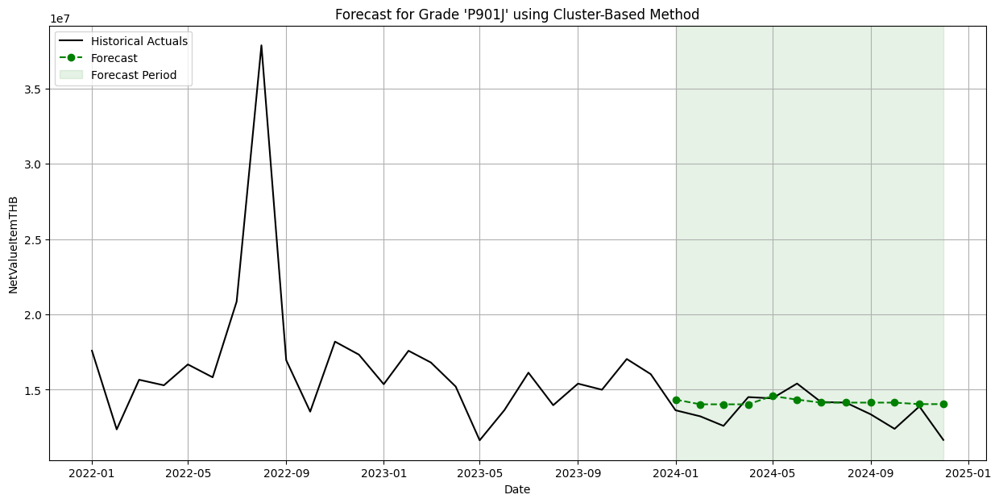

In [ ]:
# Visualize the best sales forecast
if not top_10_sales.empty:
    best_grade_info = top_10_sales.iloc[0]
    best_grade = best_grade_info['Grade']
    best_smape = best_grade_info['sMAPE']
    
    print(f"\nVisualizing best forecast for Grade: {best_grade} (sMAPE: {best_smape:.2f}%)")
    
    # Get actuals and forecast for plotting
    actuals_to_plot = df_orig[df_orig['Grade'] == best_grade][['NetValueItemTHB']].resample('MS').sum()
    forecast_to_plot = final_grade_forecasts[best_grade]['Sales']
    
    plt.figure(figsize=(15, 7))
    plt.plot(actuals_to_plot.index, actuals_to_plot['NetValueItemTHB'], label='Historical Actuals', color='black')
    plt.plot(forecast_to_plot.index, forecast_to_plot, label='Forecast', color='green', marker='o', linestyle='--')
    
    # Highlight the test period
    plt.axvspan(forecast_to_plot.index.min(), forecast_to_plot.index.max(), color='green', alpha=0.1, label='Forecast Period')
    
    plt.title(f"Forecast for Grade '{best_grade}' using Cluster-Based Method")
    plt.xlabel("Date")
    plt.ylabel("NetValueItemTHB")
    plt.legend()
    plt.grid(True)
    plt.show()

C:\Users\2025trainees99\AppData\Local\Temp\ipykernel_28472\3579734297.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=reliability_counts.index, y=reliability_counts.values, palette=colors)


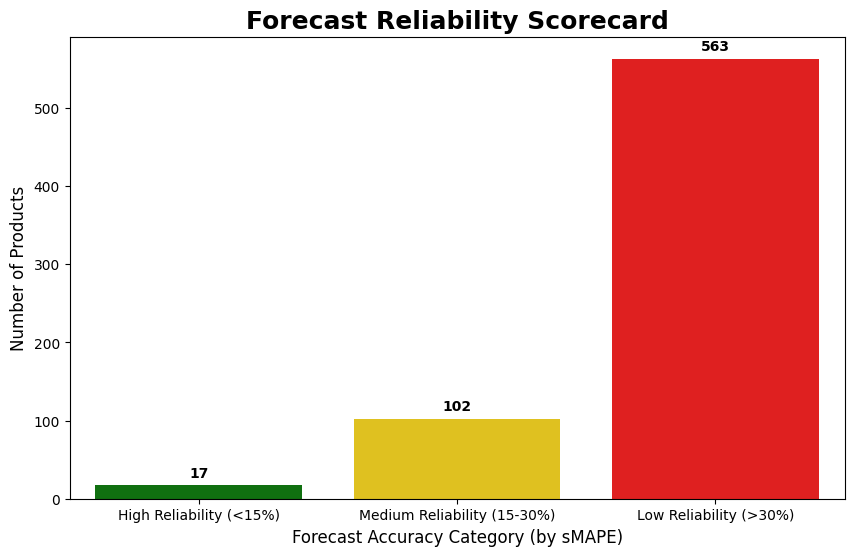

In [ ]:
# Assuming you have the 'eval_df' DataFrame from the previous step
# Green (High Reliability / sMAPE < 15%): These are excellent forecasts. We can confidently use them for planning.
# Yellow (Medium Reliability / sMAPE 15-30%): These forecasts are decent but should be used with some caution. 
# They are good for general planning but may need larger safety stocks.
# Red (Low Reliability / sMAPE > 30%): These forecasts are currently unreliable. They indicate highly unpredictable products that pose a risk to planning.

if 'eval_df' in locals():
    # Create the reliability categories
    bins = [0, 15, 30, float('inf')]
    labels = ['High Reliability (<15%)', 'Medium Reliability (15-30%)', 'Low Reliability (>30%)']
    eval_df['Reliability'] = pd.cut(eval_df['sMAPE'], bins=bins, labels=labels, right=False)
    
    # Count the number of forecasts in each category
    reliability_counts = eval_df['Reliability'].value_counts().sort_index()
    
    # Plotting
    plt.figure(figsize=(10, 6))
    colors = ['green', 'gold', 'red']
    ax = sns.barplot(x=reliability_counts.index, y=reliability_counts.values, palette=colors)
    
    plt.title('Forecast Reliability Scorecard', fontsize=18, fontweight='bold')
    plt.xlabel('Forecast Accuracy Category (by sMAPE)', fontsize=12)
    plt.ylabel('Number of Products', fontsize=12)
    plt.xticks(rotation=0)
    
    # Add labels on top of the bars
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', 
                    xytext=(0, 9), 
                    textcoords='offset points',
                    fontweight='bold')
        
    plt.show()

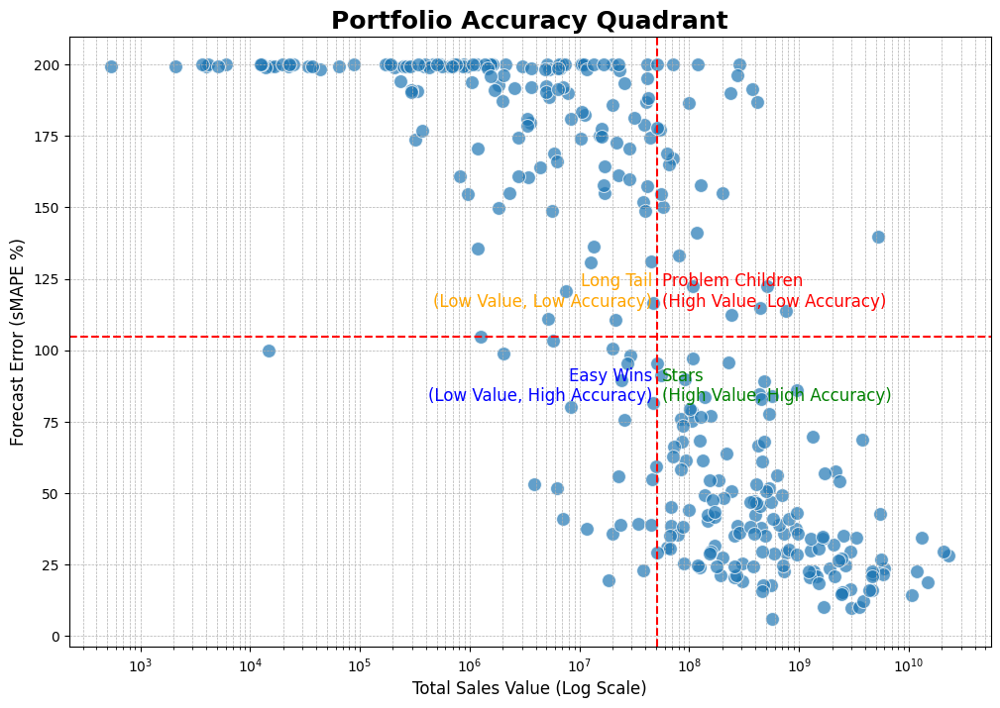

In [ ]:
# We need to get the total sales value for each grade
total_sales = df_orig.groupby('Grade')['NetValueItemTHB'].sum().reset_index()
sales_eval_df = eval_df[eval_df['Target'] == 'Sales'].copy()
quadrant_df = pd.merge(sales_eval_df, total_sales, on='Grade')

# Plotting
plt.figure(figsize=(12, 8))
sns.scatterplot(data=quadrant_df, x='NetValueItemTHB', y='sMAPE', s=100, alpha=0.7)

# Use a log scale for the x-axis to better visualize products with different sales volumes
plt.xscale('log')
plt.title('Portfolio Accuracy Quadrant', fontsize=18, fontweight='bold')
plt.xlabel('Total Sales Value (Log Scale)', fontsize=12)
plt.ylabel('Forecast Error (sMAPE %)', fontsize=12)

# Add quadrant lines (adjust these thresholds based on your data)
avg_sales = quadrant_df['NetValueItemTHB'].median()
avg_error = quadrant_df['sMAPE'].median()
plt.axvline(x=avg_sales, color='red', linestyle='--')
plt.axhline(y=avg_error, color='red', linestyle='--')

# Add text labels for the quadrants
plt.text(avg_sales*1.1, avg_error*1.1, 'Problem Children\n(High Value, Low Accuracy)', color='red', fontsize=12)
plt.text(avg_sales*1.1, avg_error*0.9, 'Stars\n(High Value, High Accuracy)', color='green', fontsize=12, va='top')
plt.text(avg_sales*0.9, avg_error*1.1, 'Long Tail\n(Low Value, Low Accuracy)', color='orange', fontsize=12, ha='right')
plt.text(avg_sales*0.9, avg_error*0.9, 'Easy Wins\n(Low Value, High Accuracy)', color='blue', fontsize=12, ha='right', va='top')

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

In [ ]:
# Assuming you have the 'quadrant_df' DataFrame from the previous step
if 'quadrant_df' in locals():
    # Define the thresholds using the median (which is robust to outliers)
    sales_threshold = quadrant_df['NetValueItemTHB'].median()
    error_threshold = quadrant_df['sMAPE'].median()

    # --- Define the four quadrants by filtering the DataFrame ---
    stars_df = quadrant_df[
        (quadrant_df['NetValueItemTHB'] >= sales_threshold) & 
        (quadrant_df['sMAPE'] < error_threshold)
    ]
    
    problem_children_df = quadrant_df[
        (quadrant_df['NetValueItemTHB'] >= sales_threshold) & 
        (quadrant_df['sMAPE'] >= error_threshold)
    ]
    
    easy_wins_df = quadrant_df[
        (quadrant_df['NetValueItemTHB'] < sales_threshold) & 
        (quadrant_df['sMAPE'] < error_threshold)
    ]
    
    wildcards_df = quadrant_df[
        (quadrant_df['NetValueItemTHB'] < sales_threshold) & 
        (quadrant_df['sMAPE'] >= error_threshold)
    ]

    # --- Generate the report text ---
    print("="*60)
    print("        PORTFOLIO ACCURACY QUADRANT - DETAILED REPORT")
    print("="*60)

    # Report on Stars
    print(f"\n⭐ Quadrant 1: The 'Stars' (High Value, Low Error)")
    print(f"   - Number of Products: {len(stars_df)}")
    if not stars_df.empty:
        # Sort by sales value to show the most important ones
        top_stars = stars_df.sort_values('NetValueItemTHB', ascending=False).head(10)
        print(f"   - Top 10 Examples by Sales Value: {top_stars['Grade'].tolist()}")

    # Report on Problem Children
    print(f"\n❓ Quadrant 2: The 'Problem Children' (High Value, High Error)")
    print(f"   - Number of Products: {len(problem_children_df)}")
    if not problem_children_df.empty:
        top_problems = problem_children_df.sort_values('NetValueItemTHB', ascending=False).head(10)
        print(f"   - Top 10 Examples by Sales Value (Highest Priority): {top_problems['Grade'].tolist()}")
        
    # Report on Easy Wins
    print(f"\n✅ Quadrant 3: The 'Easy Wins' (Low Value, Low Error)")
    print(f"   - Number of Products: {len(easy_wins_df)}")
    if not easy_wins_df.empty:
        top_easy = easy_wins_df.sort_values('NetValueItemTHB', ascending=False).head(10)
        print(f"   - Top 10 Examples by Sales Value: {top_easy['Grade'].tolist()}")

    # Report on Wildcards
    print(f"\n🎲 Quadrant 4: The 'Wildcards' (Low Value, High Error)")
    print(f"   - Number of Products: {len(wildcards_df)}")
    if not wildcards_df.empty:
        top_wild = wildcards_df.sort_values('sMAPE', ascending=False).head(10)
        print(f"   - Top 10 Examples by Unpredictability: {top_wild['Grade'].tolist()}")
        
    print("\n" + "="*60)

else:
    print("Please generate the 'quadrant_df' DataFrame first.")


        PORTFOLIO ACCURACY QUADRANT - DETAILED REPORT

⭐ Quadrant 1: The 'Stars' (High Value, Low Error)
   - Number of Products: 147
   - Top 10 Examples by Sales Value: ['SP660', 'S199F', 'D777C', 'H1000PC', 'H112PC', 'P601F', 'D388C', 'P740J', 'P400S', 'SG660']

❓ Quadrant 2: The 'Problem Children' (High Value, High Error)
   - Number of Products: 24
   - Top 10 Examples by Sales Value (Highest Priority): ['P483JU', 'M3204RU', 'H6105JU', 'SM58S', 'P945J', 'SP661', 'H6670B', 'P851JO', 'SM71S', 'P902J']

✅ Quadrant 3: The 'Easy Wins' (Low Value, Low Error)
   - Number of Products: 23
   - Top 10 Examples by Sales Value: ['LP1208L', 'WH2045P', 'LP1060P', 'SC840', 'SB31L', '10901CLA', 'M90WTT2P', 'P341S', 'P348S', 'LP0400F']

🎲 Quadrant 4: The 'Wildcards' (Low Value, High Error)
   - Number of Products: 147
   - Top 10 Examples by Unpredictability: ['X42P001J', 'H800B', 'P780J', 'H1000P', 'X53H001W', 'P701JP', 'M50WTM1', 'H5604FP', 'M10WTM1P', 'H800J']



### Summary Table: Cluster vs. Quadrant


| **Attribute**           | **Clustering (Step 1)**                                     | **Quadrant Analysis (Step 4)**                                |
|:------------------------|:------------------------------------------------------------|:--------------------------------------------------------------|
| **Purpose**             | To **group similar items** to improve forecast accuracy.      | To **categorize results** to create a business strategy.      |
| **What it Groups**      | Products (`Grades`)                                         | Products (`Grades`)                                           |
| **How Groups are Formed** | Based on **similarity of historical sales patterns.**         | Based on **final business metrics** (Sales Value vs. Error).    |
| **Number of Groups**    | **Variable** (You chose 5 based on the Elbow Method).       | **Always 4** (by definition of a 2x2 grid).                   |
| **Analogy**             | Creating "Divisions" in a sports league.                    | Creating a "post-season strategic map" for each team.         |

---



      VISUALIZING FORECASTS FOR QUADRANT: 'Stars'
(Showing the top 10 of 147 grades in this quadrant)


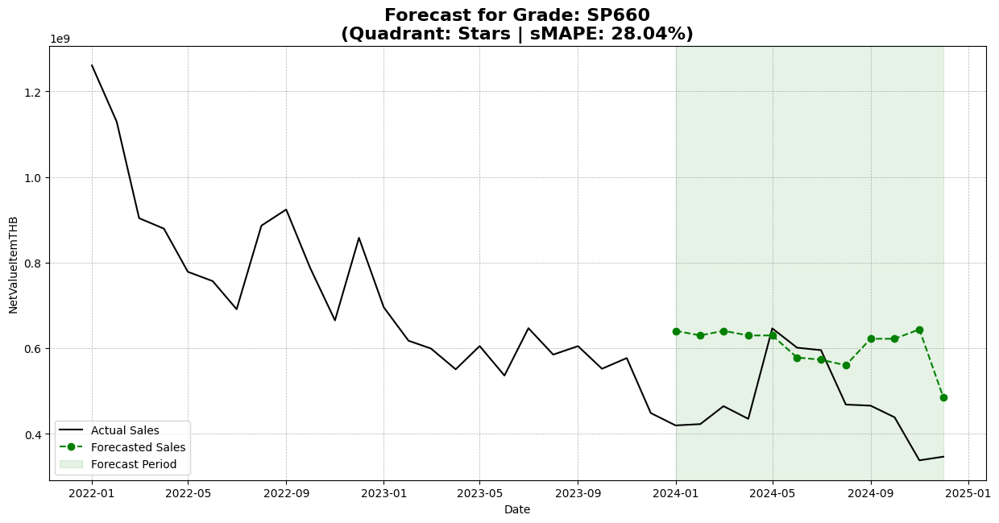

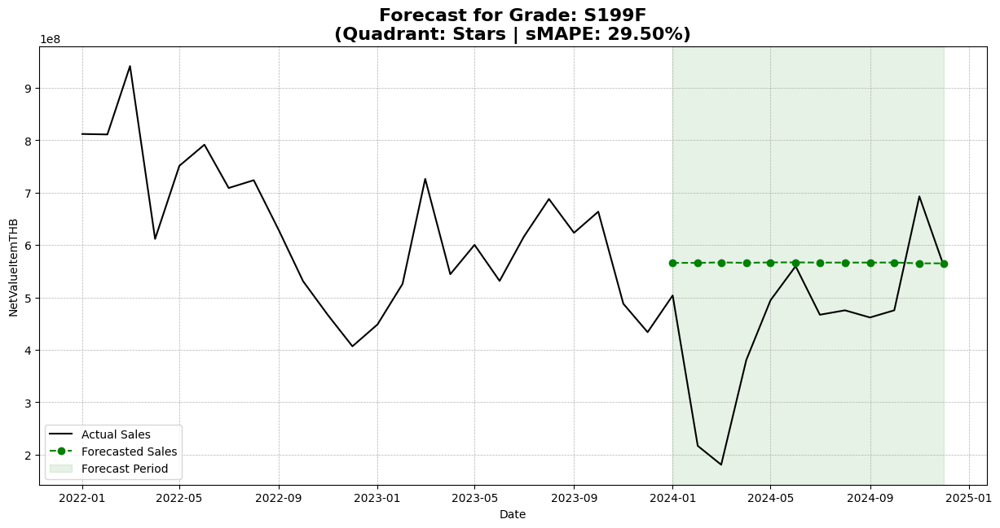

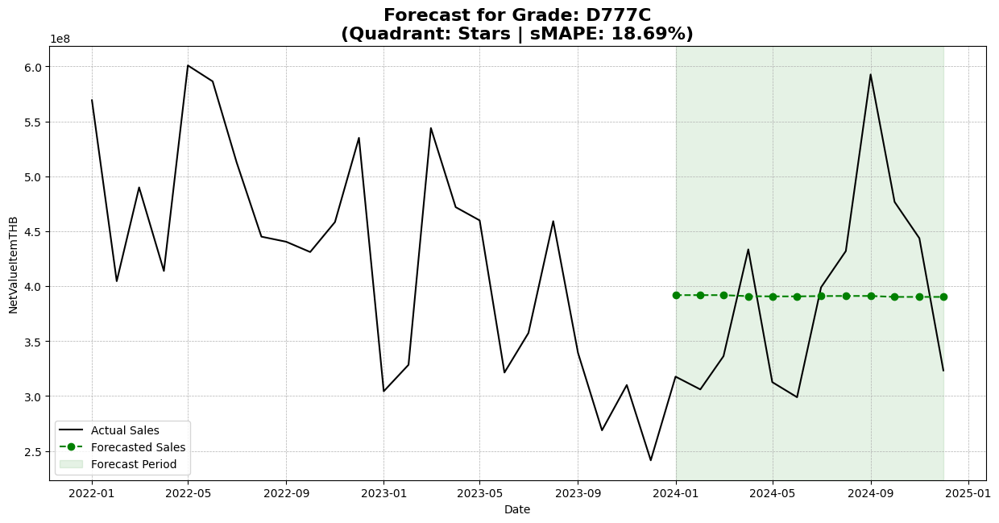

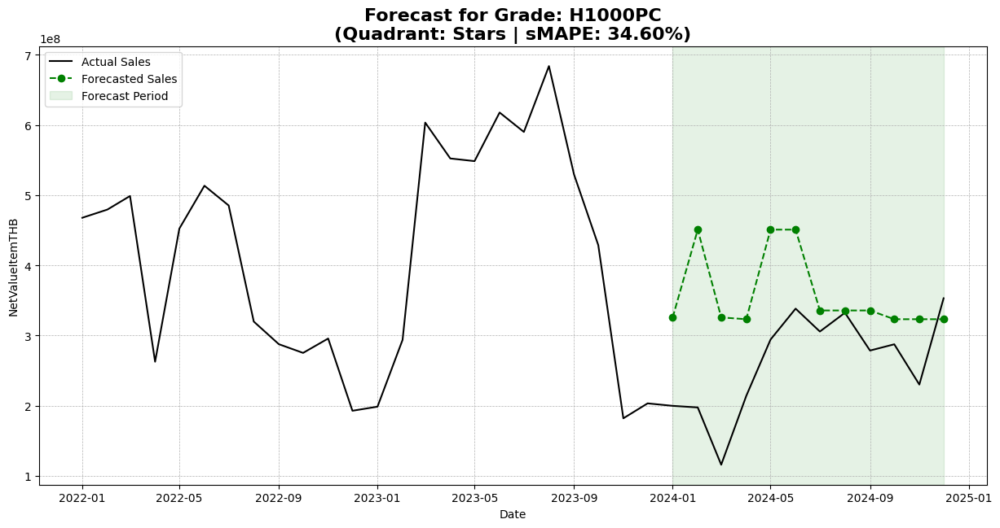

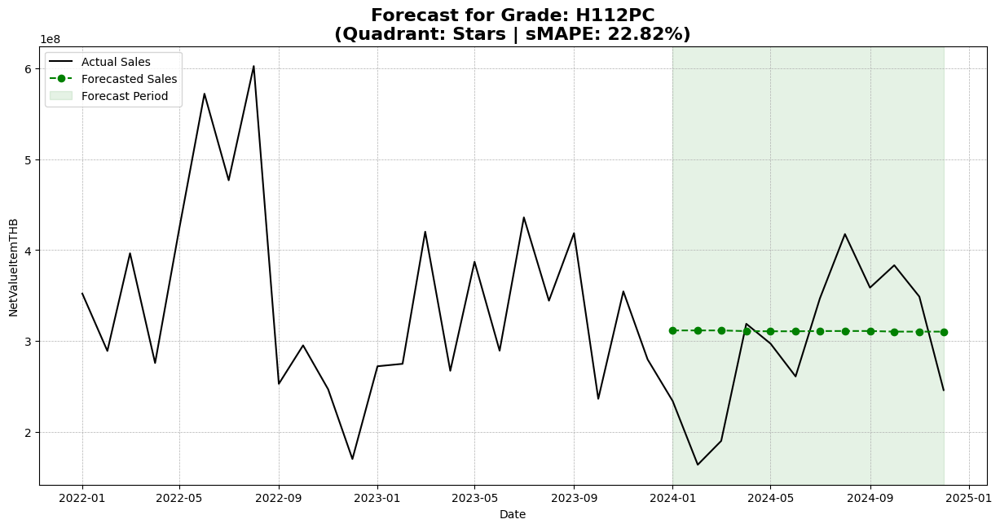

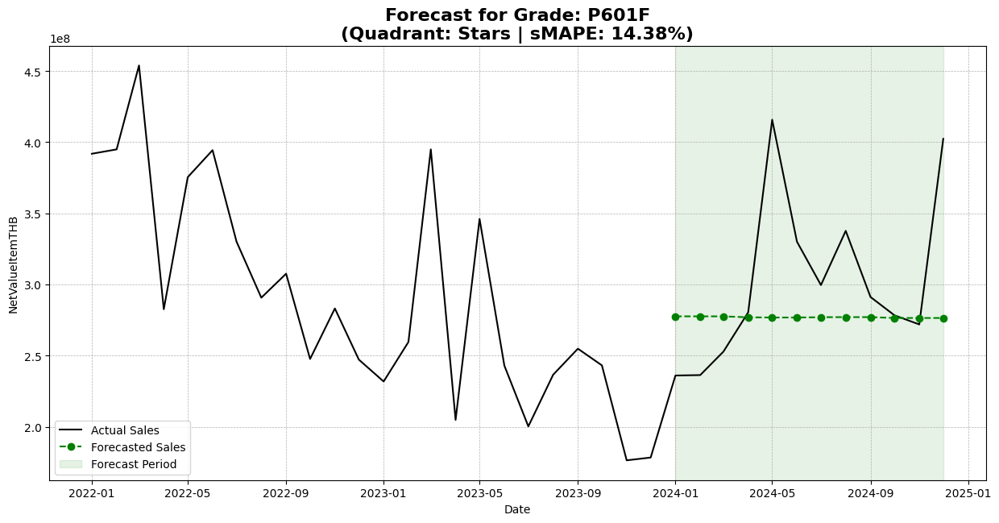

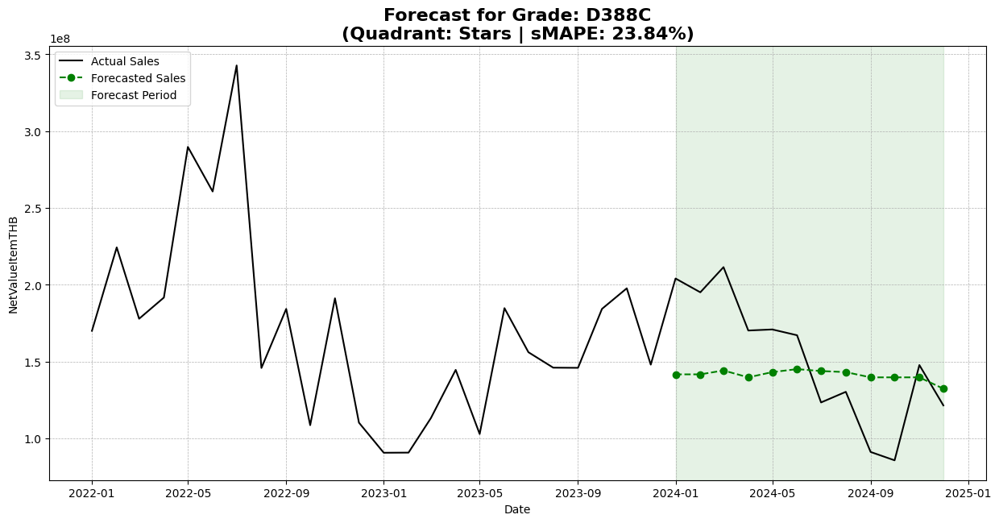

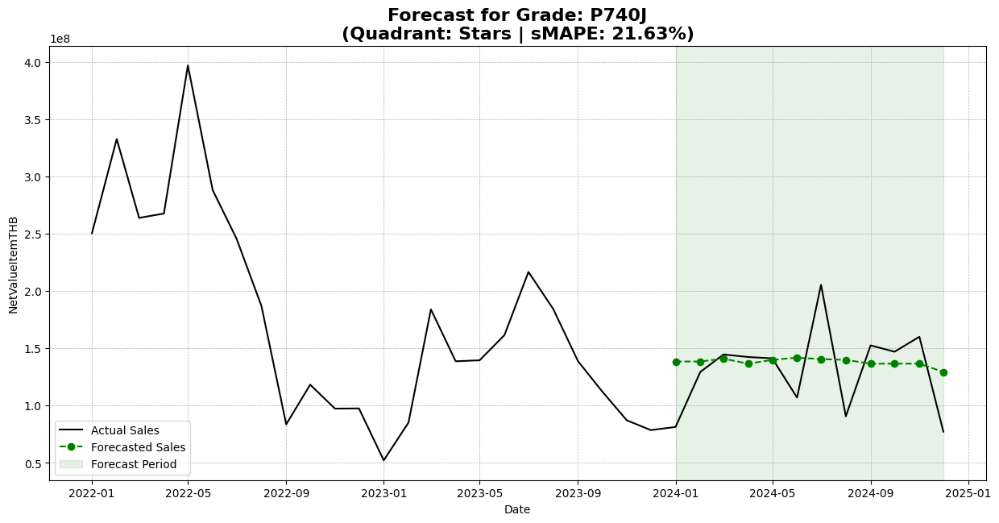

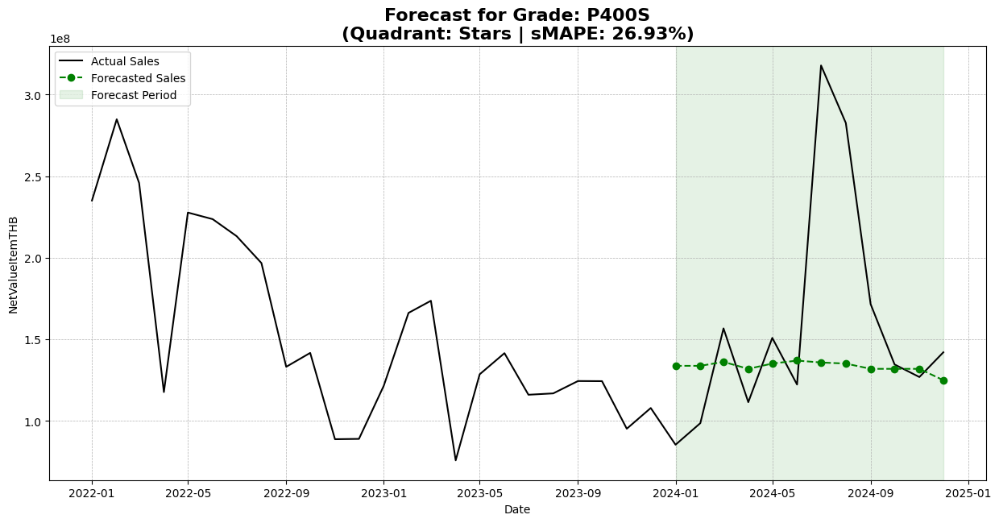

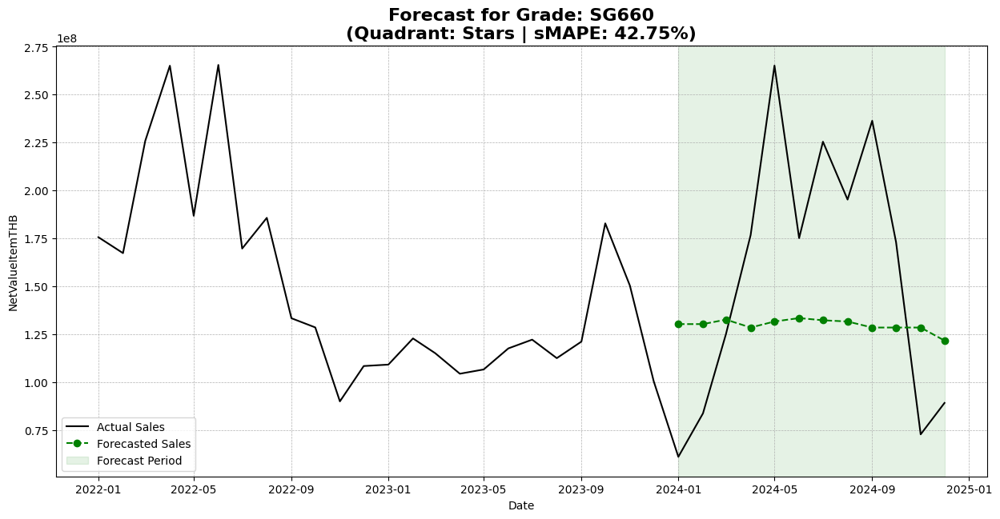


      VISUALIZING FORECASTS FOR QUADRANT: 'Problem Children'


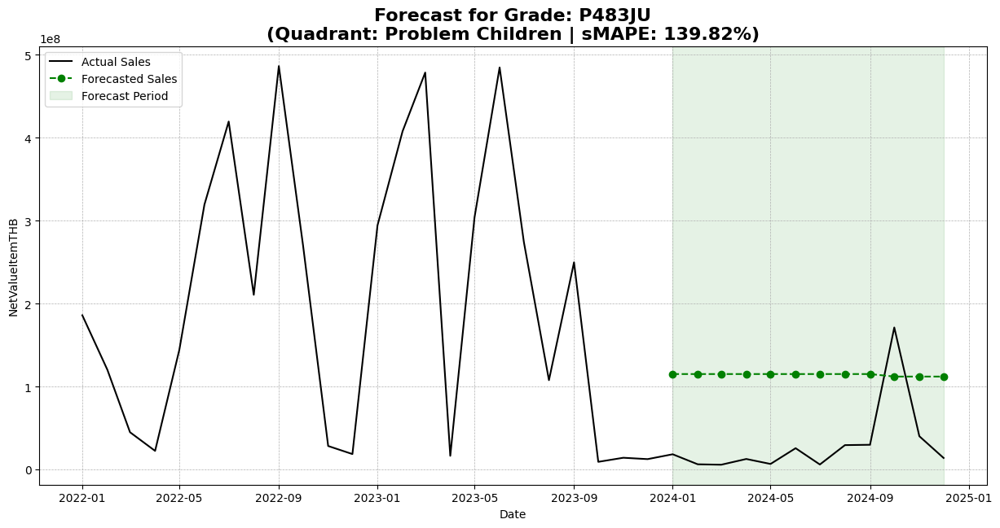

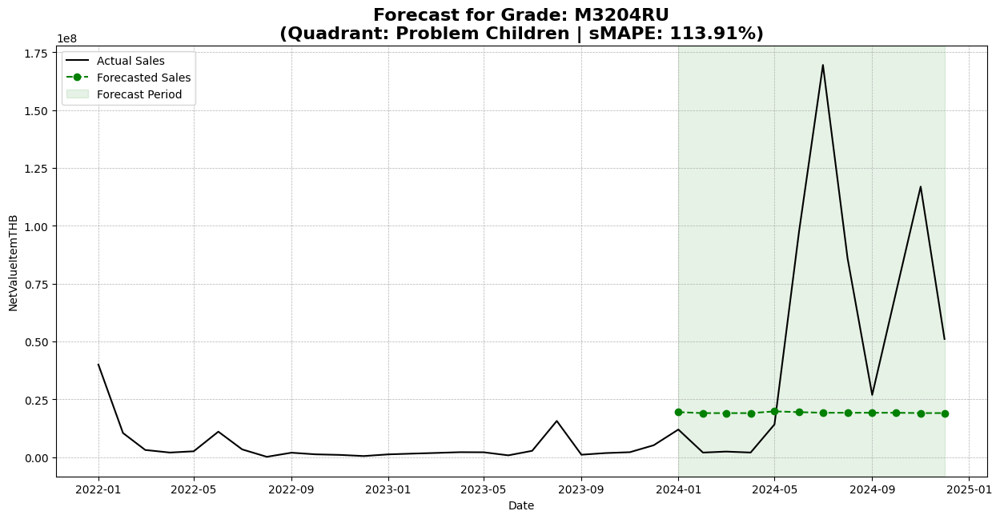

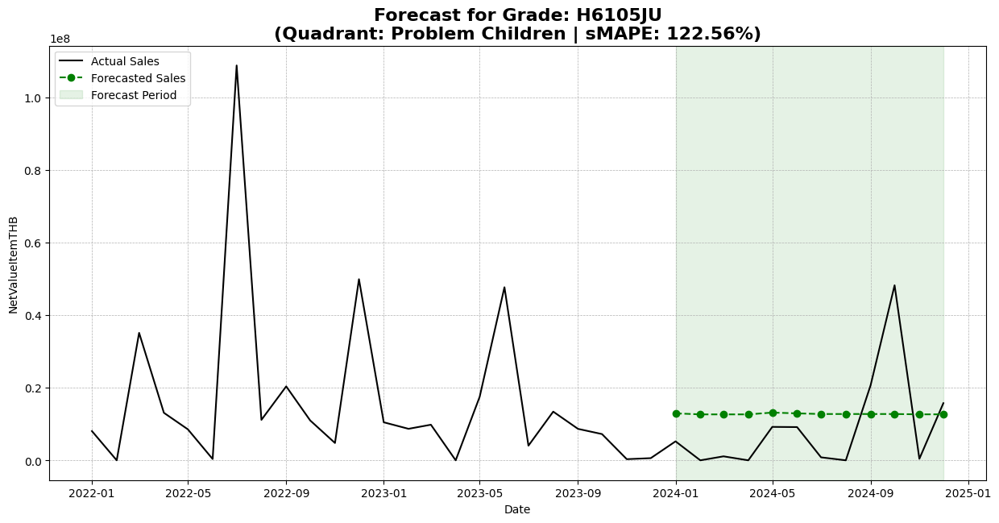

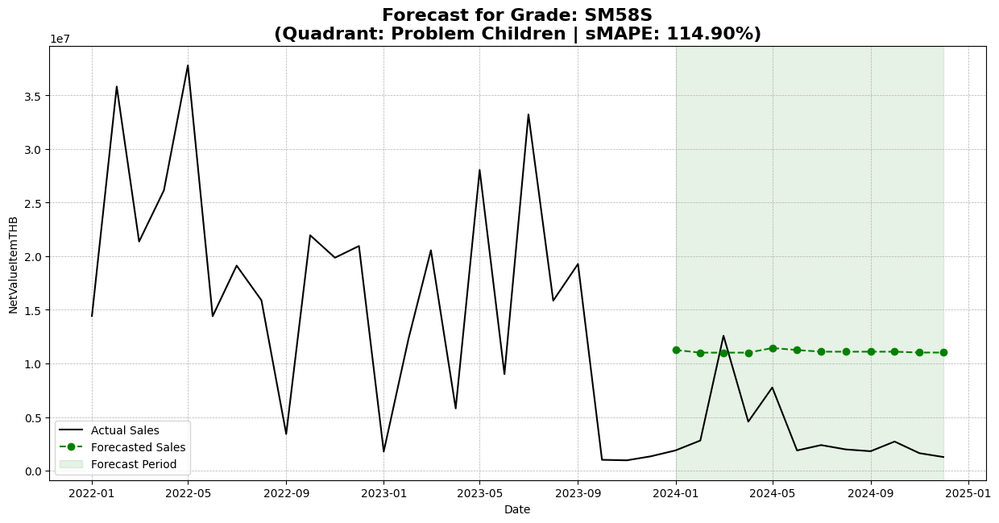

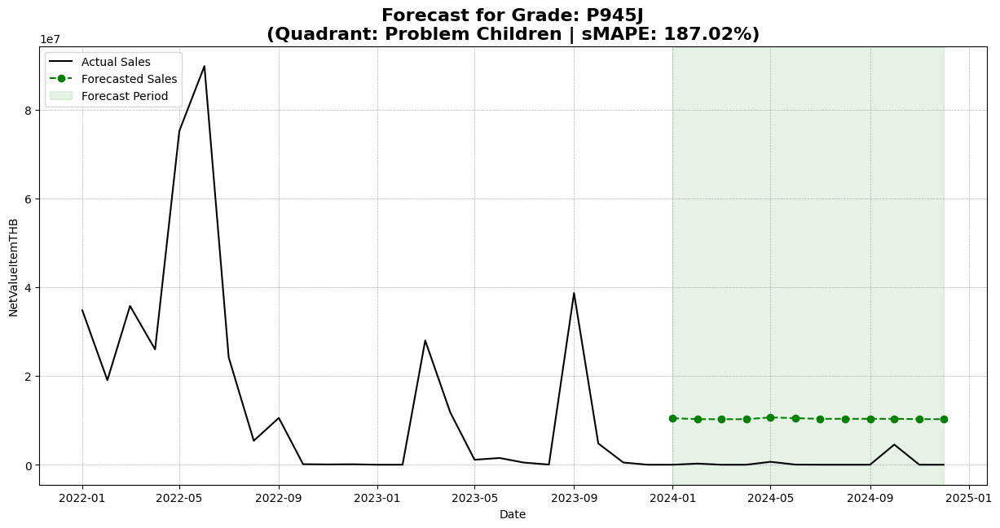

...

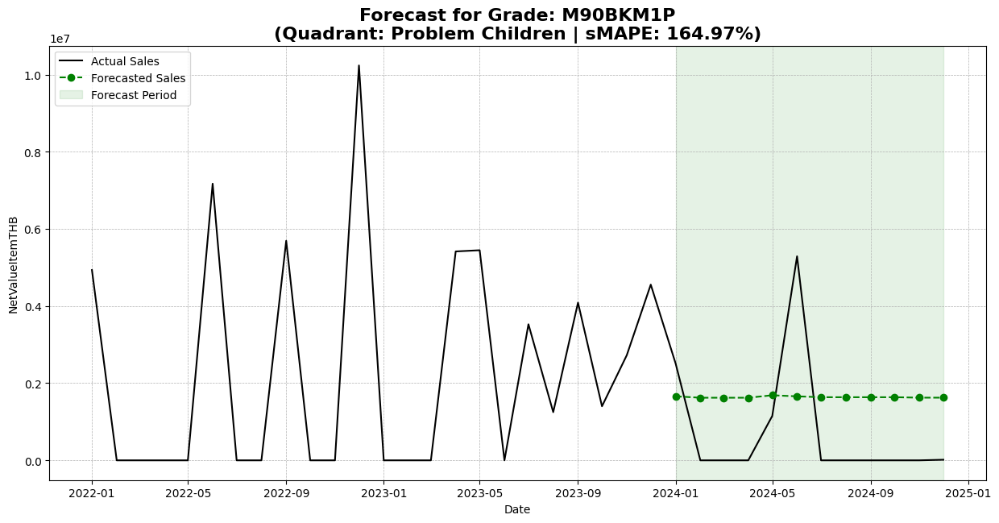

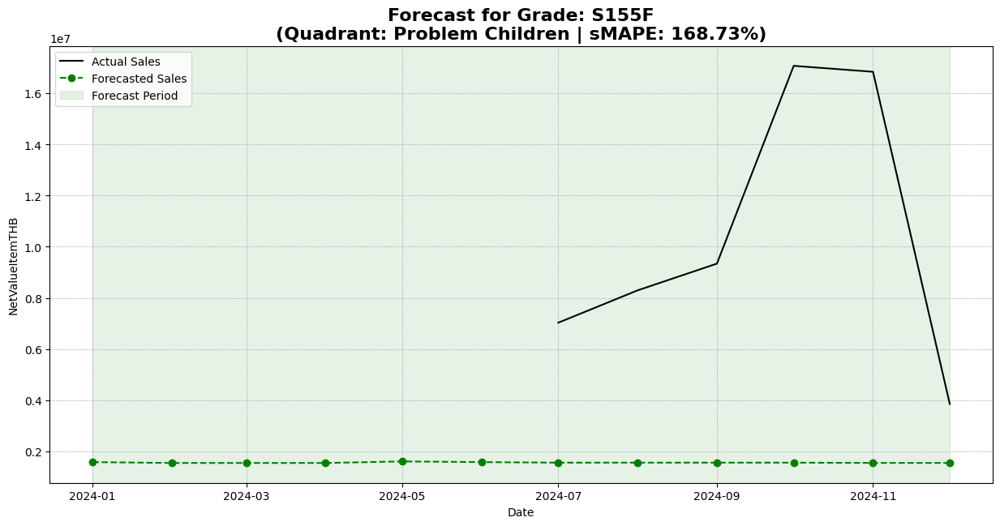

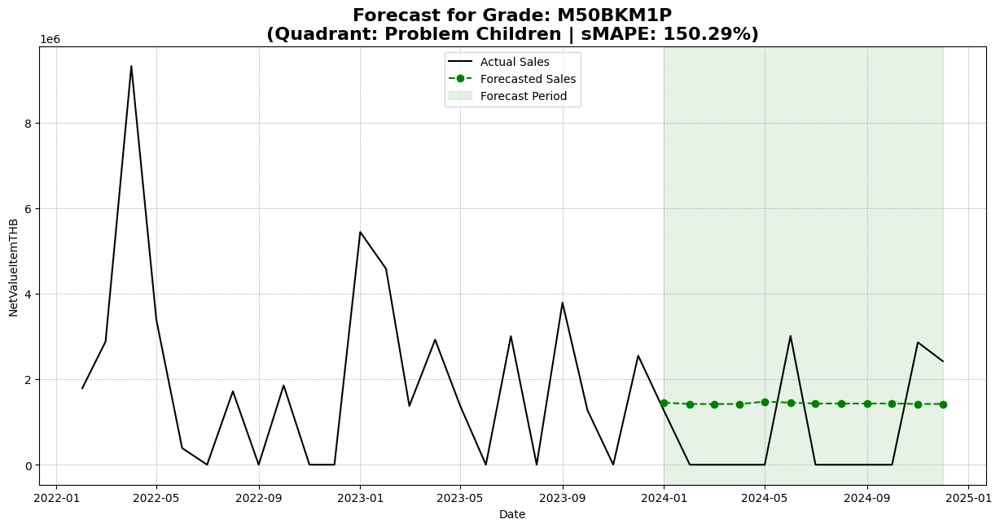

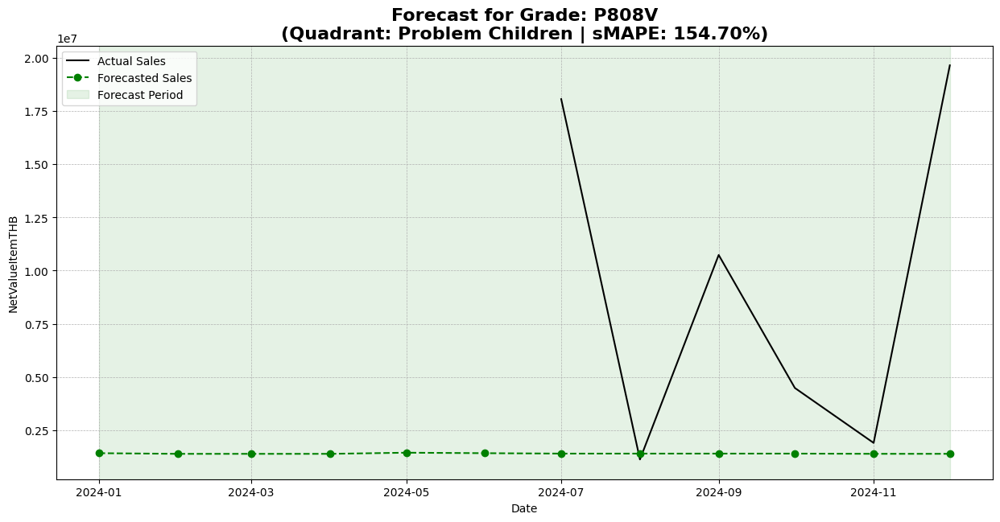

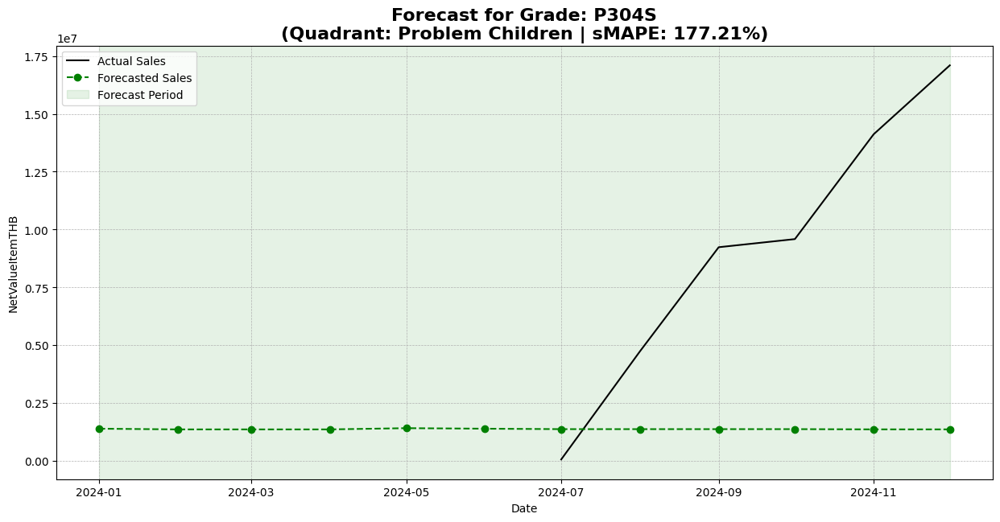


      VISUALIZING FORECASTS FOR QUADRANT: 'Easy Wins'


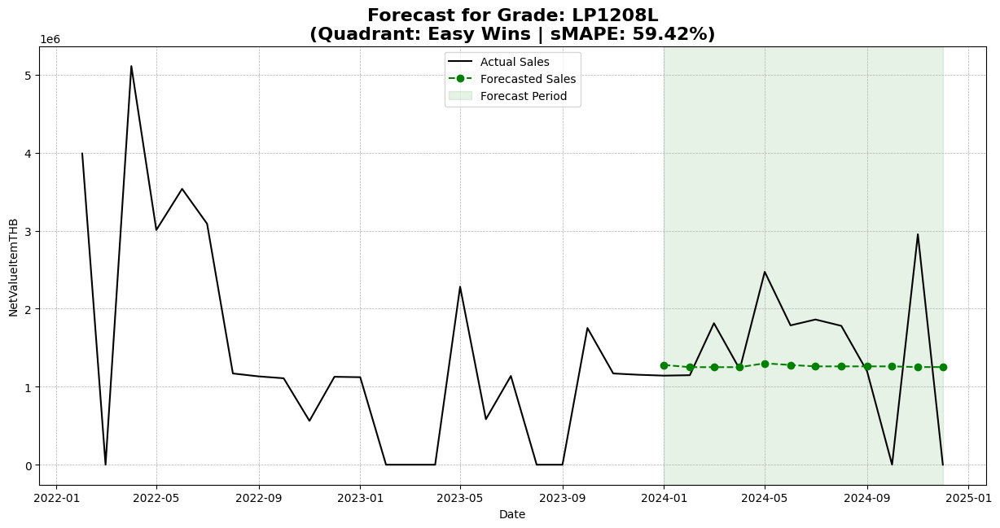

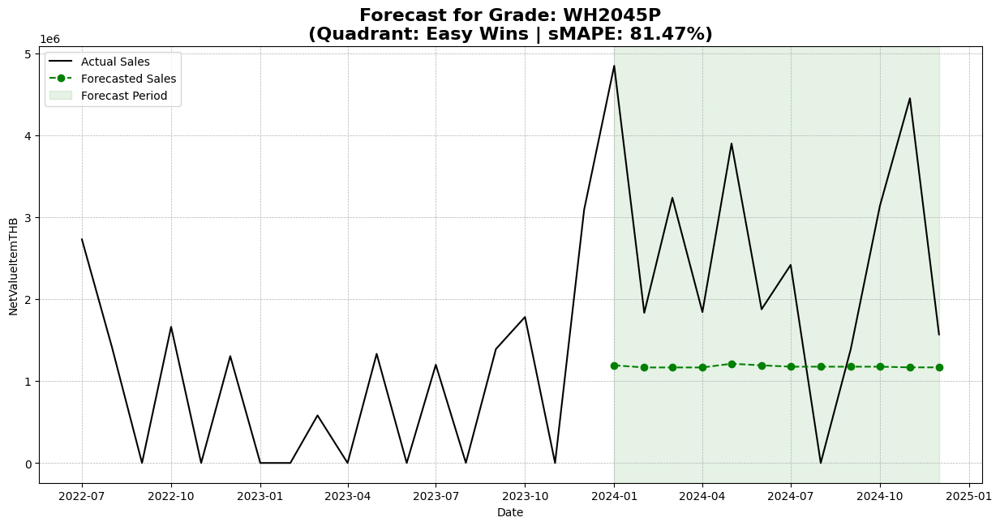

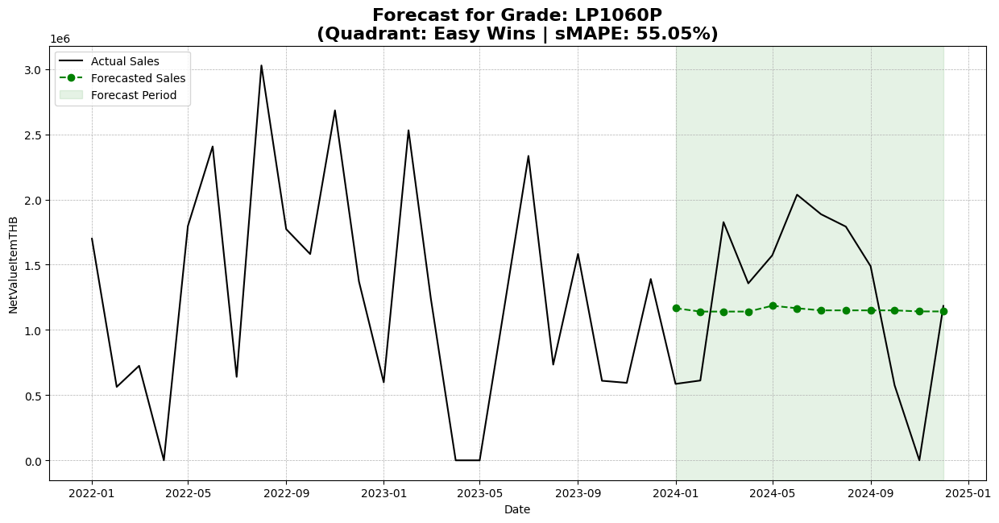

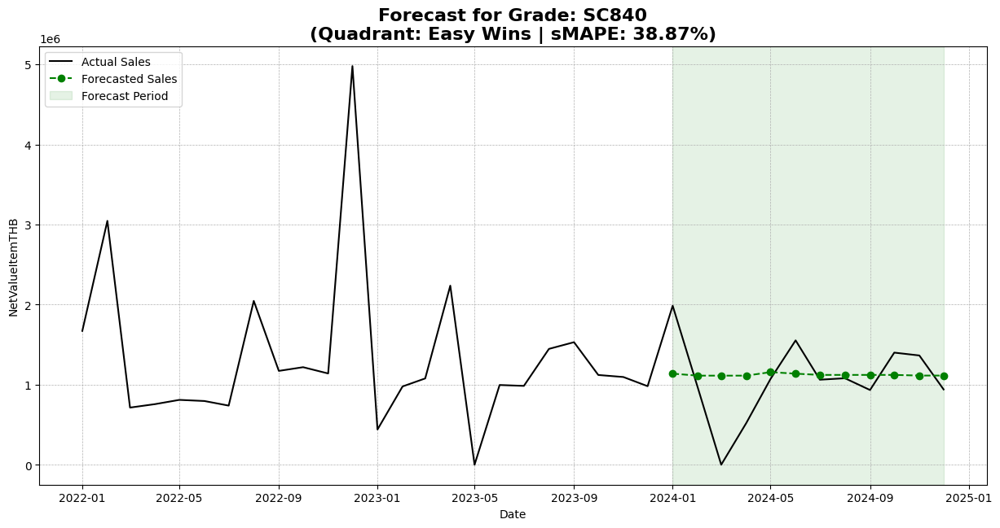

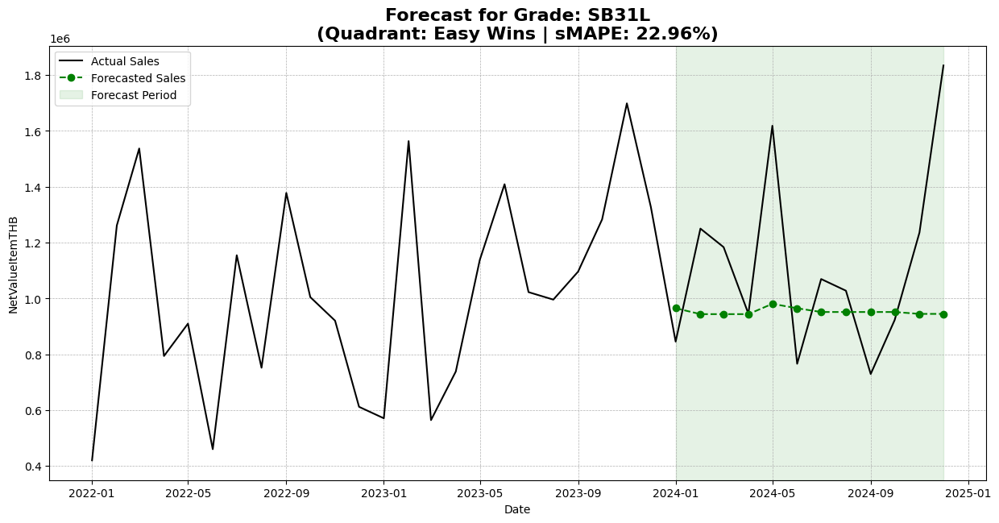

...

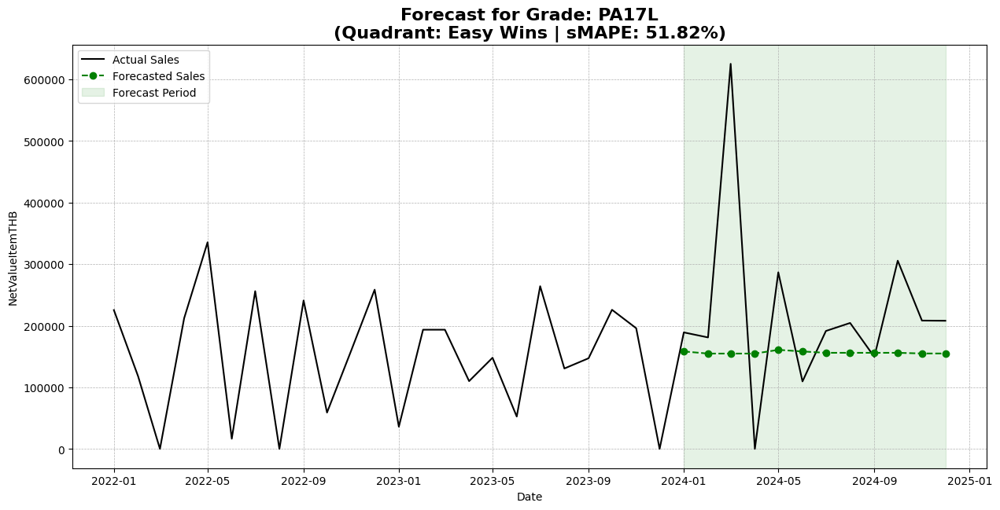

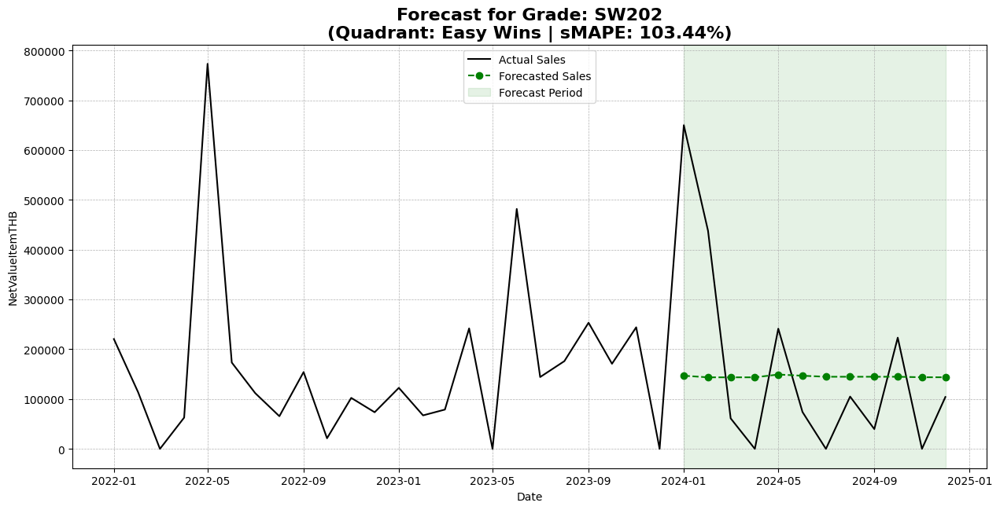

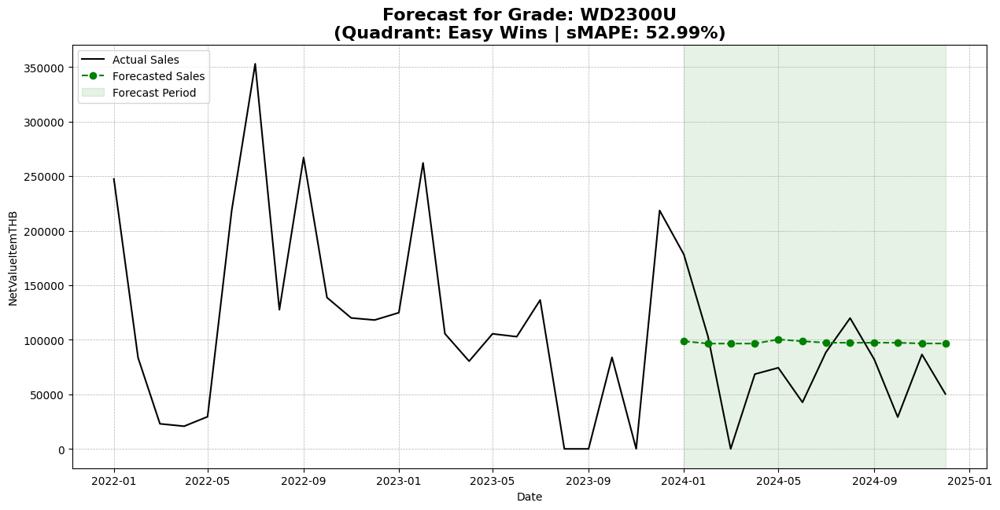

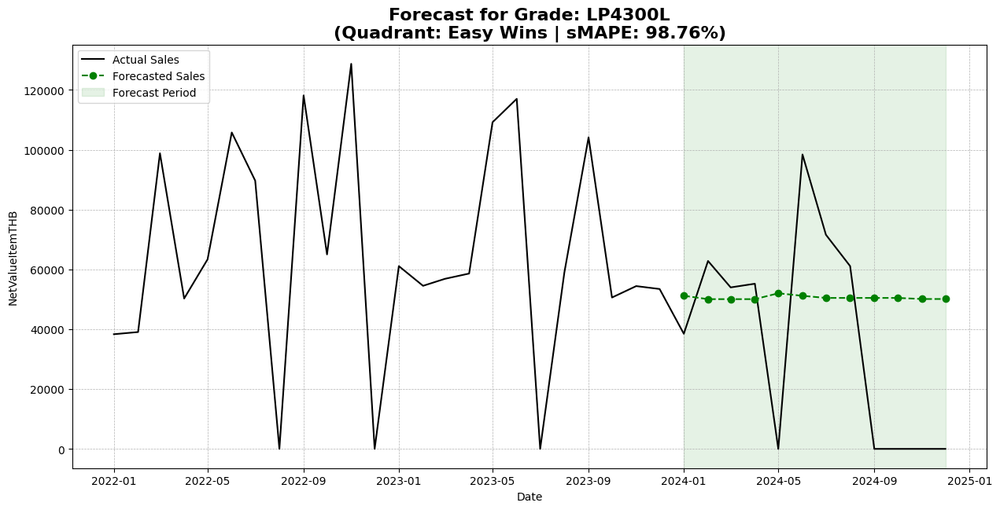

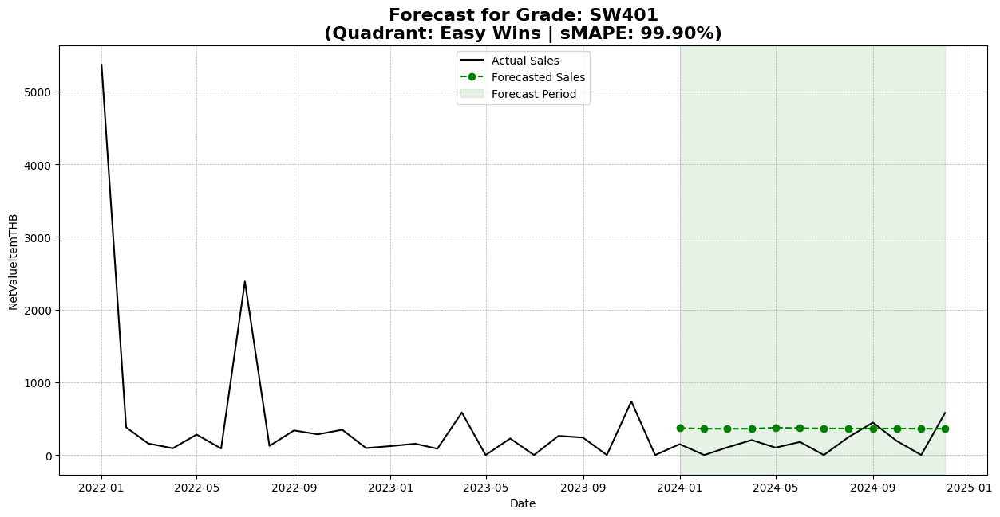


      VISUALIZING FORECASTS FOR QUADRANT: 'Wildcards'
(Showing the top 10 of 147 grades in this quadrant)


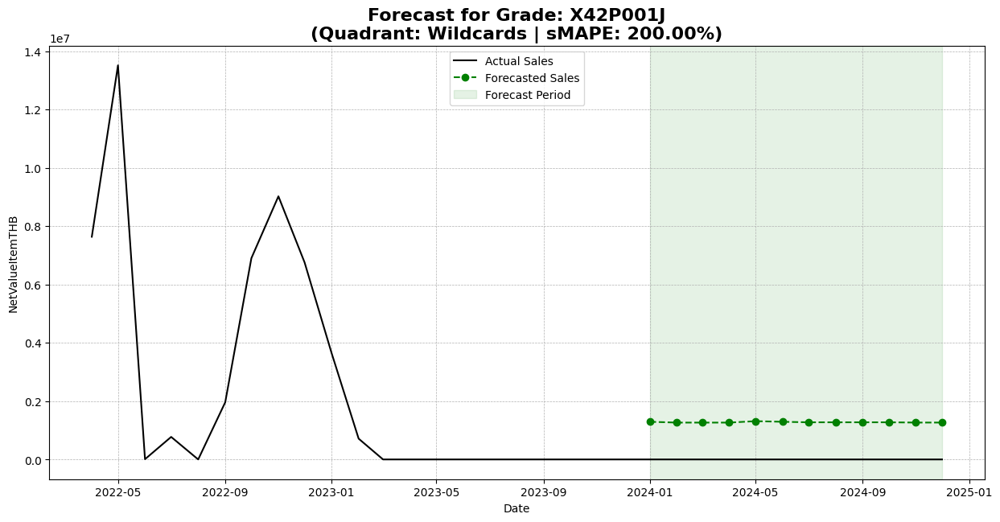

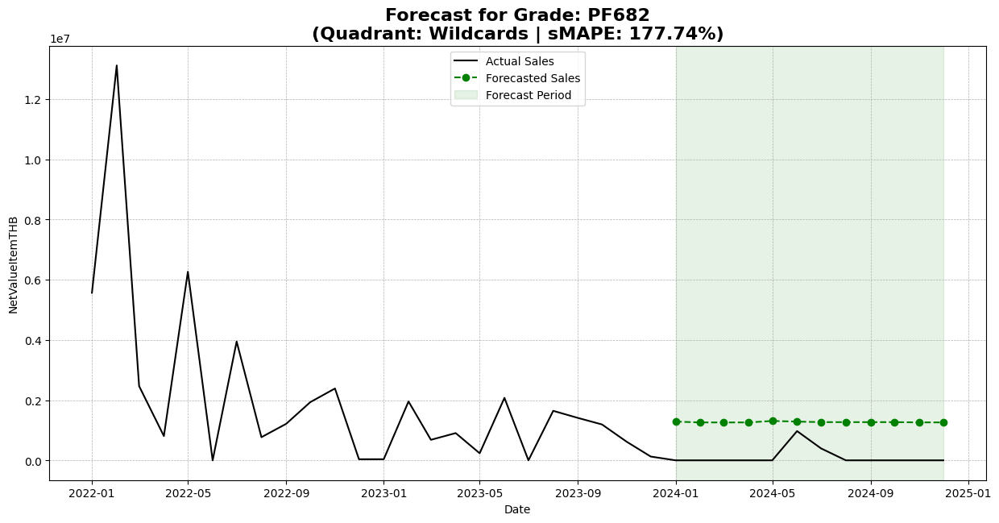

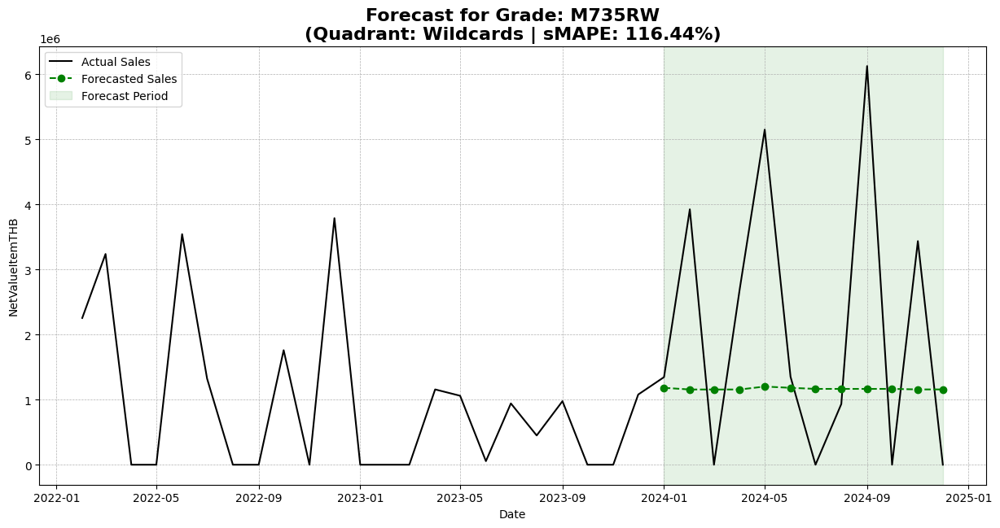

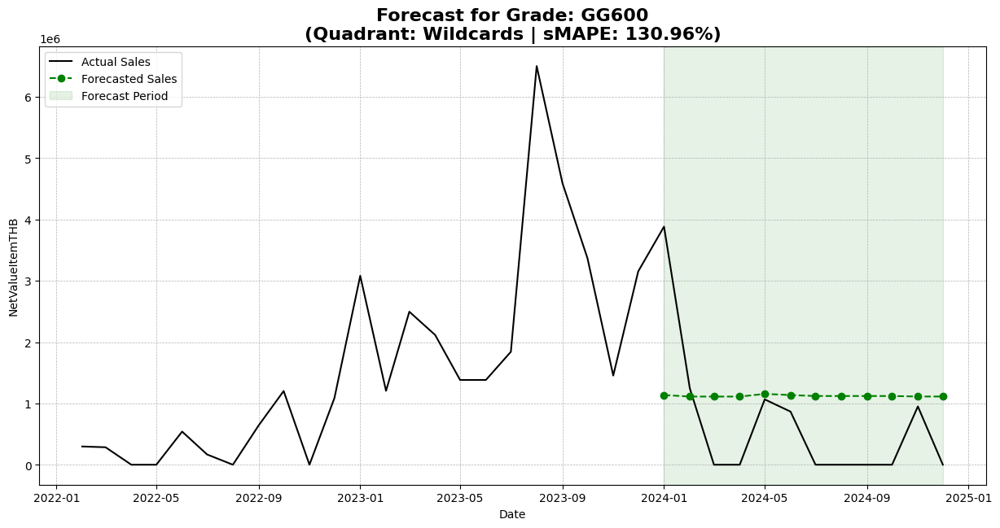

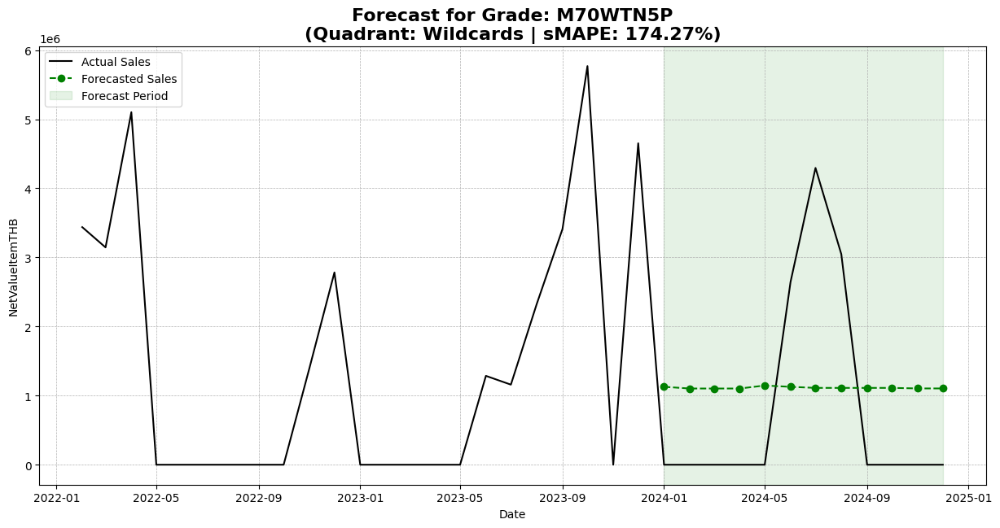

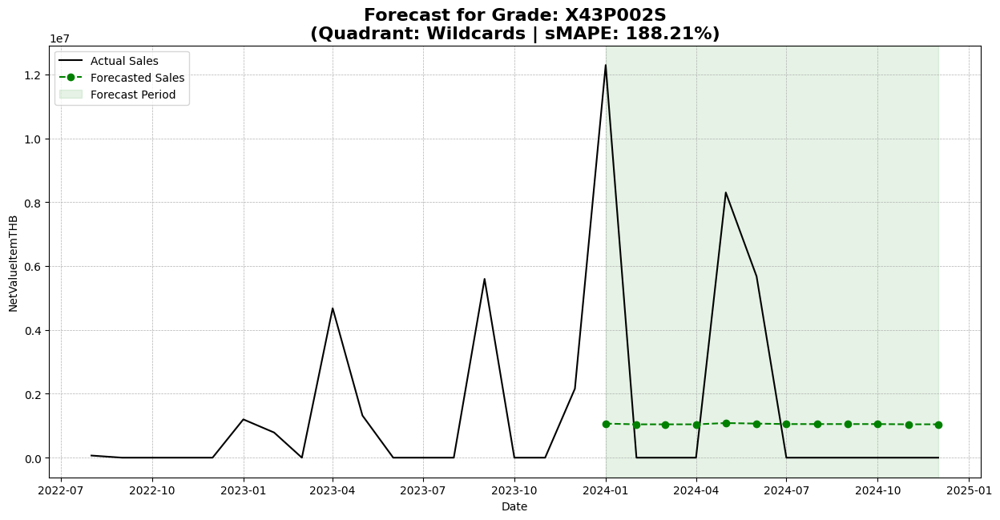

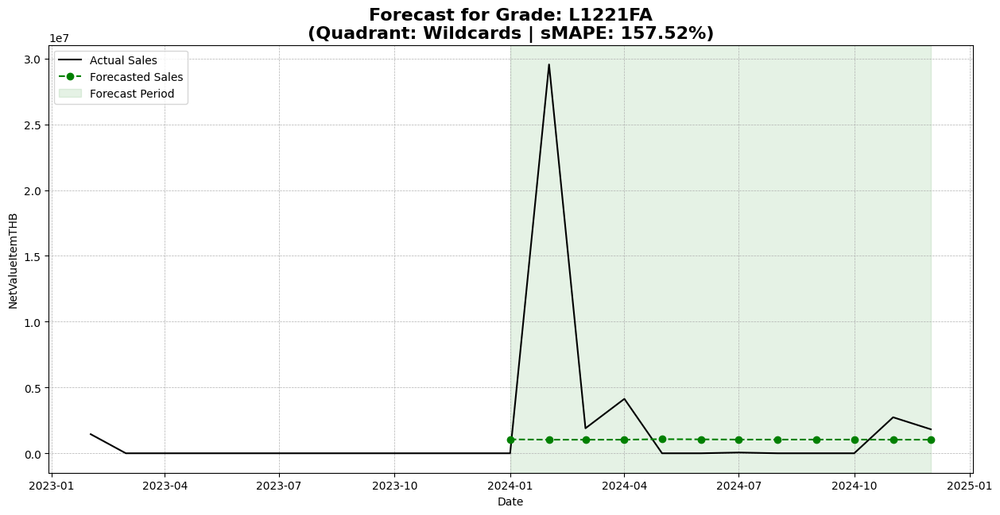

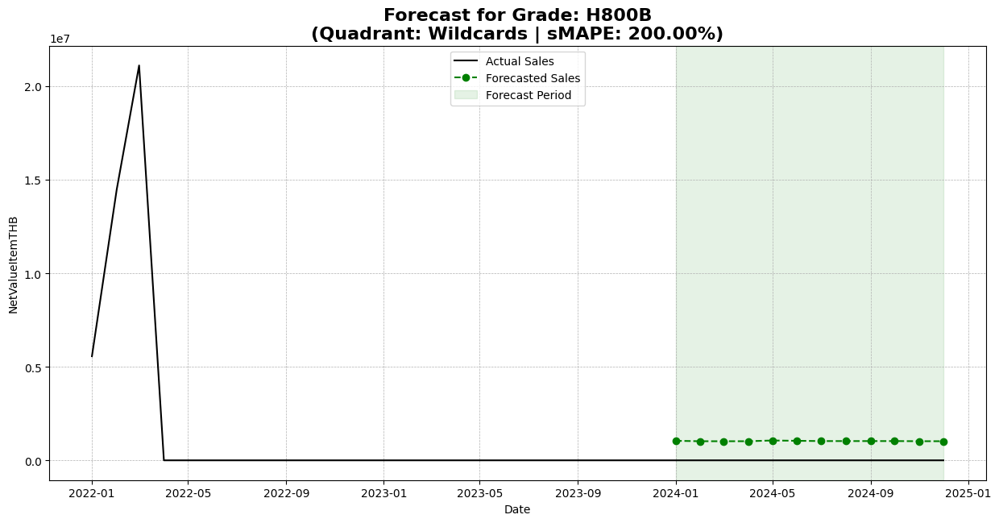

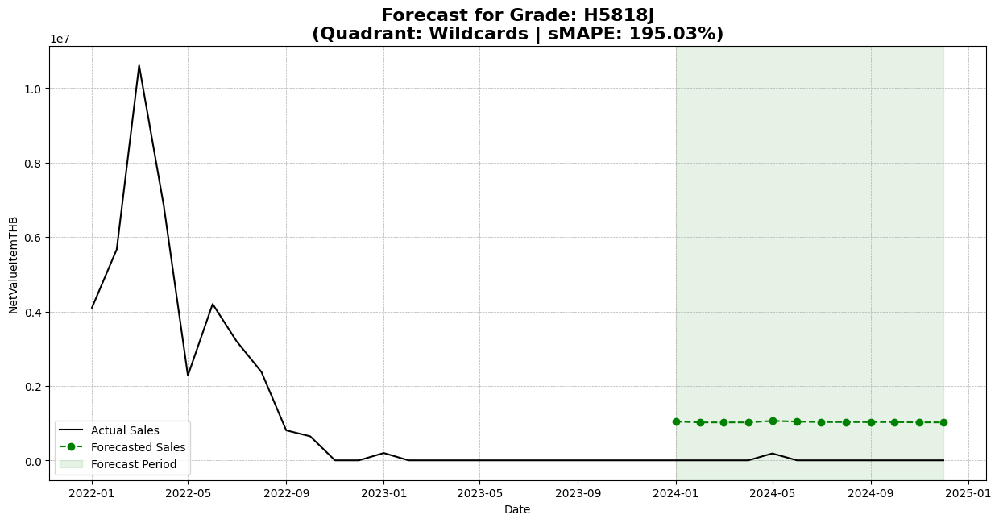

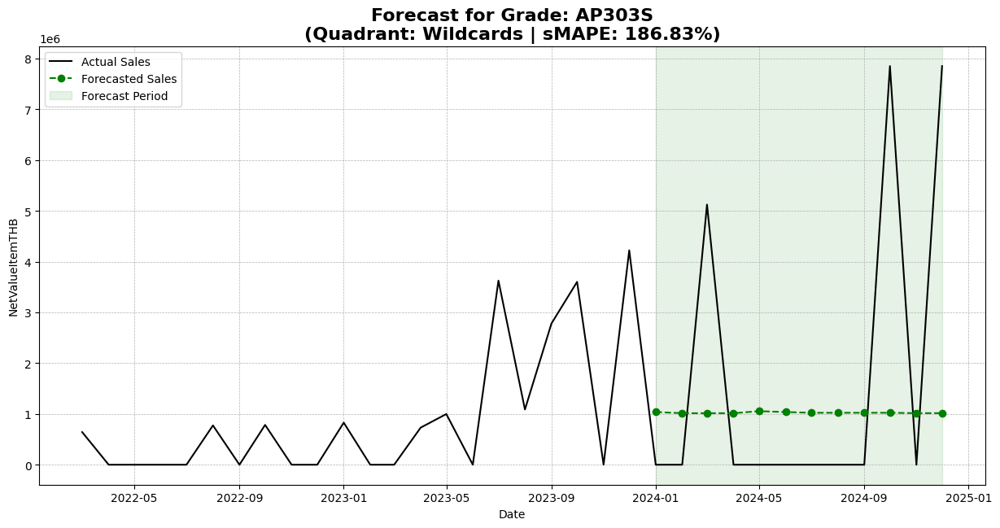

In [ ]:
#  Visualizing All Forecasts by Quadrant ---

# First, let's create a master plotting function to avoid repeating code
def plot_forecasts_for_grades(grade_list, quadrant_name, full_forecasts_dict, actuals_df, eval_df, limit=None):
    """
    A master function to plot the forecasts for a given list of grades.

    Args:
        grade_list (list): A list of grade names to plot.
        quadrant_name (str): The name of the quadrant for the title.
        full_forecasts_dict (dict): The dictionary containing all forecast data.
        actuals_df (pd.DataFrame): The original DataFrame with all historical sales.
        eval_df (pd.DataFrame): The DataFrame with evaluation metrics (for sMAPE).
        limit (int, optional): The maximum number of charts to display. Defaults to None (all).
    """
    print("\n" + "="*60)
    print(f"      VISUALIZING FORECASTS FOR QUADRANT: '{quadrant_name}'")
    print("="*60)
    
    # If a limit is set, only plot the top N grades from the list
    if limit:
        print(f"(Showing the top {limit} of {len(grade_list)} grades in this quadrant)")
        grade_list = grade_list[:limit]

    for grade in grade_list:
        if grade not in full_forecasts_dict:
            print(f"Skipping grade {grade}: No forecast data found.")
            continue
            
        # Get forecast and actuals data
        forecast_data = full_forecasts_dict[grade]['Sales']
        actual_data = actuals_df[actuals_df['Grade'] == grade][['NetValueItemTHB']].resample('MS').sum()
        
        # Get the sMAPE score for the title
        try:
            smape_score = eval_df[(eval_df['Grade'] == grade) & (eval_df['Target'] == 'Sales')]['sMAPE'].iloc[0]
        except IndexError:
            smape_score = -1 # Or some other indicator for 'not found'
            
        # Ensure the 'actuals' line extends through the forecast period
        full_range = pd.date_range(start=actual_data.index.min(), end=forecast_data.index.max(), freq='MS')
        actual_data = actual_data.reindex(full_range, fill_value=0)
        
        # Plotting
        plt.figure(figsize=(15, 7))
        plt.plot(actual_data.index, actual_data['NetValueItemTHB'], label='Actual Sales', color='black', linewidth=1.5)
        plt.plot(forecast_data.index, forecast_data, label='Forecasted Sales', color='green', marker='o', linestyle='--')
        
        # Highlight the forecast period
        plt.axvspan(forecast_data.index.min(), forecast_data.index.max(), color='green', alpha=0.1, label='Forecast Period')
        
        plt.title(f"Forecast for Grade: {grade}\n(Quadrant: {quadrant_name} | sMAPE: {smape_score:.2f}%)", fontsize=16, fontweight='bold')
        plt.xlabel("Date")
        plt.ylabel("NetValueItemTHB")
        plt.legend()
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.show()

# Assuming you have the quadrant DataFrames (stars_df, etc.) from the previous step
if 'stars_df' in locals():
    # Sort each quadrant by sales value to see the most important ones first
    stars_list = stars_df.sort_values('NetValueItemTHB', ascending=False)['Grade'].tolist()
    problem_children_list = problem_children_df.sort_values('NetValueItemTHB', ascending=False)['Grade'].tolist()
    easy_wins_list = easy_wins_df.sort_values('NetValueItemTHB', ascending=False)['Grade'].tolist()
    wildcards_list = wildcards_df.sort_values('NetValueItemTHB', ascending=False)['Grade'].tolist()

    # --- Call the plotting function for each quadrant ---
    # We will limit the large quadrants to the top 10 for a quick review.
    # To see all 147 charts, simply remove the `limit=10` parameter.
    
    plot_forecasts_for_grades(
        grade_list=stars_list, 
        quadrant_name="Stars", 
        full_forecasts_dict=final_grade_forecasts, 
        actuals_df=df_orig, 
        eval_df=eval_df, 
        limit=10  #<-- SEE TOP 10. Remove this line to see all 147.
    )

    plot_forecasts_for_grades(
        grade_list=problem_children_list, 
        quadrant_name="Problem Children", 
        full_forecasts_dict=final_grade_forecasts, 
        actuals_df=df_orig, 
        eval_df=eval_df
        # No limit here, as there are only 24
    )
    
    plot_forecasts_for_grades(
        grade_list=easy_wins_list, 
        quadrant_name="Easy Wins", 
        full_forecasts_dict=final_grade_forecasts, 
        actuals_df=df_orig, 
        eval_df=eval_df
        # No limit here, as there are only 23
    )
    
    plot_forecasts_for_grades(
        grade_list=wildcards_list, 
        quadrant_name="Wildcards", 
        full_forecasts_dict=final_grade_forecasts, 
        actuals_df=df_orig, 
        eval_df=eval_df, 
        limit=10 #<-- SEE TOP 10. Remove this line to see all 147.
    )
else:
    print("Please generate the quadrant DataFrames first by running the previous report code.")
